In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from os import path
import xarray as xr
from matplotlib.colors import Normalize, LinearSegmentedColormap
from netCDF4 import Dataset as ncdf
import matplotlib.lines as mlines
import matplotlib.colors as colors

from mmctools.helper_functions import theta_to_T, lowess_mean
from mmctools.wrf.utils import Tower, tsout_seriesReader, write_tslist_file
from mmctools.plotting import TaylorDiagram
from scipy.stats import pearsonr

In [3]:
import os, sys
module_path = os.path.join(os.environ['HOME'],'Code/Python')
if module_path not in sys.path:
    sys.path.append(module_path)
from pydicts.obsdict import get_FINO_obs

# Load case dictionary

In [4]:
wrf_dir   = '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/'
from FINO_case_dict import case_dict
cases = list(case_dict.keys())

#cases = []
#for case in list(case_dict.keys()):
#    if len(case_dict[case]) > 1:
#        doms = list(case_dict[case].keys())
#        for dom in doms:
#            case_name = '{}_{}'.format(case,dom)
#            cases.append(case_name)
#    else:
#        case_name = '{}_{}'.format(case,list(case_dict[case].keys())[0])
#        cases.append(case_name)


In [5]:
full_2_weeks = False

In [6]:
if full_2_weeks:
    restarts  = ['FINO_2010051212', 'FINO_2010051412', 'FINO_2010051612', 'FINO_2010051812',
                 'FINO_2010052012', 'FINO_2010052212', 'FINO_2010052412']
    wrf_start = ['2010-05-12 12:00:00', '2010-05-14 12:00:00', '2010-05-16 12:00:00', '2010-05-18 12:00:00',
                 '2010-05-20 12:00:00', '2010-05-22 12:00:00', '2010-05-24 12:00:00']
    ncases = len(cases)
    case_days_start = ['2010-05-13']
    case_days_end   = ['2010-05-26']
    n_case_days = len(case_days_start)
else:
    restarts  = ['FINO_2010051412']
    wrf_start = ['2010-05-14 12:00:00']
    ncases = len(cases)
    case_days_start = ['2010-05-15']
    case_days_end   = ['2010-05-17']
    n_case_days = len(case_days_start)

In [7]:
read_in_obs = True
save_figs   = False

# Get Obs

In [8]:
if read_in_obs:
    obs_dir = '/glade/work/hawbecke/MMC/FINO/'
    obs_year = 2010
    fino_obs = {'FINO1': [],
                'FINO2': [],
                'FINO3': []}
    boom_deg = 345
    for ff, fino in enumerate([1,2,3]):
        fino_obs_name = '{}FINO{}_obs.nc'.format(obs_dir,fino)
        if path.exists(fino_obs_name):
            print('loading in full dataset!')
            fino_obs['FINO{}'.format(fino)] = xr.open_dataset(fino_obs_name)
        else:
            print('Getting obs dataset for {}FINO{}/Year{}/'.format(obs_dir,fino,obs_year))
            fino_obs['FINO{}'.format(fino)] = get_FINO_obs('{}FINO{}/Year{}/'.format(obs_dir,fino,obs_year),FINO=fino,boom_deg=boom_deg)
            fino_obs['FINO{}'.format(fino)].to_netcdf(fino_obs_name)

loading in full dataset!
loading in full dataset!
loading in full dataset!


# Get WRF towers

### To get towers interpolated to obs levels:

In [9]:
wrf_twrs = {}
for case in cases:
    case_dir = '{}{}/'.format(wrf_dir,case)
    wrf_twrs[case] = {'FN1': [],
                      'FN2': [],
                      'FN3': []}
    dom = list(case_dict[case].keys())[0]
    if dom == 'd03':
        time_step = 3.0
    elif dom == 'd02':
        time_step = 15.0
    else:
        time_step = 75
    print('Starting case: {}-{} ∆t={}'.format(case,dom,time_step))
    
    for ff, fino in enumerate([1,3]):
        twr_path = '{}/FINO{}_{}.nc'.format(case_dir,fino,dom)
        if path.exists(twr_path):
            print('loading in full dataset!')
            wrf_twrs[case]['FN{}'.format(fino)] = xr.open_dataset(twr_path)
        else:
            if read_in_obs:
                obs_ds = fino_obs['FINO{}'.format(fino)]
                obs_levels = np.unique(sorted(np.concatenate([obs_ds.spd_levels.data, obs_ds.dir_levels.data,obs_ds.tmp_levels.data])))
            else:
                if fino == 1:
                    obs_levels = np.asarray([30.,  33.,  40.,  50.,  60.,  70.,  80.,  90., 100.])
                elif fino == 2:
                    obs_levels = np.asarray([30.,  31.,  32.,  40.,  42.,  50.,  51.,  52.,  62.,  70.,  71.,  72.,  82.,  91.,  92.,  99., 102.])
                elif fino == 3:
                    obs_levels = np.asarray([28.,  29.,  30.,  40.,  50.,  55.,  60.,  70.,  80.,  90.,  95.,  100., 106.])
                else:
                    print('fino can only be 1-3')
            wrf_twrs[case]['FN{}'.format(fino)] = tsout_seriesReader(case_dir,restarts,wrf_start,dom,structure='unordered',
                                                                     time_step=time_step,select_tower=['FN{}'.format(fino)],
                                                                     heights=obs_levels,height_var='ph')
            wrf_twrs[case]['FN{}'.format(fino)].to_netcdf(twr_path)

Starting case: ERAI_YSU_CHRN_OST_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERAI_MYJ_CHRN_OST_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: GFSR_YSU_CHRN_GFS_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: GFSR_MYJ_CHRN_GFS_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_YSU_CHRN_ER5_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_MYJ_CHRN_ER5_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_MYJ_CHRN_ER5_SKNT_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_MYJ_CHRN_ER5_OMLM_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_MYJ_JMNZ_ER5_NOSK_3DOM-d03 ∆t=3.0
loading in full dataset!
loading in full dataset!
Starting case: ERA5_MYJ_CHRN_OVT_NOSK_3DOM-d03 ∆t=3.0
loading in

In [10]:
wake_degs = {'FINO1': [300,335],
             'FINO2': [345,20],
             'FINO3': [143,188]}

In [11]:
xlim_s = pd.to_datetime('2010-05-13 00:00:00')

xlim_e = pd.to_datetime('2010-05-27 00:00:00')

xlim_s = pd.to_datetime(case_days_start)
xlim_e = pd.to_datetime(case_days_end)

In [12]:
cases_of_interest = ['ERAI_YSU_CHRN_OST_NOSK_3DOM',
                     'GFSR_YSU_CHRN_GFS_NOSK_3DOM',
                     'ERA5_YSU_CHRN_ER5_NOSK_3DOM'
                    ]

cases_of_interest = cases.copy()
#cases_of_interest = cases[:6]

cases_of_interest = []
for case in cases:
    if 'ERA5_MYJ' in case:
        cases_of_interest.append(case)
        
cases_of_interest = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_ER5_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_OVT_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_OVT_NOSK_3DOM',
                     'ERA5_YSU_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_3DP_CHRN_ER5_NOSK_3DOM'
                    ]

### Check SST Differences

/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


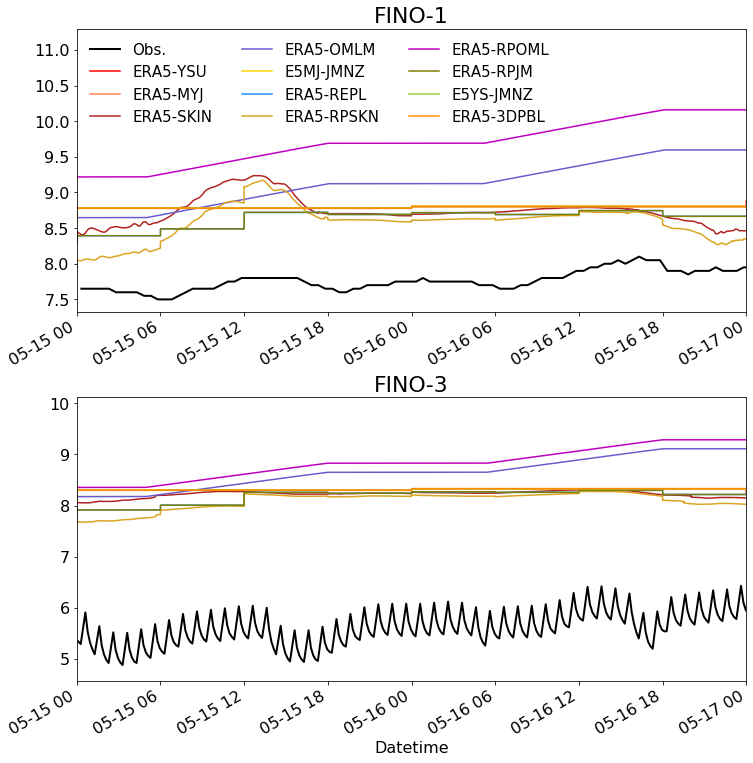

In [13]:
#sst_cases = ['ERAI_YSU_KF_CHRN_OST','ERAI_YSU_KF_CHRN_OST_SSTSKIN','ERAI_YSU_KF_CHRN_OST_SSTUPDATE',
#             'ERAI_YSU_KF_CHRN_GHR','ERAI_YSU_KF_CHRN_GHR_SSTSKIN','GFS_YSU_KF_CHRN_OST','ERA5_YSU_KF_CHRN_OST']
#sst_cases = [#'ERAI_YSU_KF_CHRN_OST','ERAI_YSU_KF_CHRN_GHR','ERAI_YSU_KF_CHRN_OST_SSTSKIN',
#             'ERA5_YSU_KF_CHRN_OST','ERA5_YSU_KF_CHRN_SSTUPDATE','ERAI_YSU_KF_CHRN_OST_SSTUPDATE',
#             #'ERAI_YSU_KF_CHRN_OST_OCEAN','ERAI_YSU_KF_CHRN_GHR_OCEAN'
#            ]
sst_cases = cases_of_interest.copy()
#sst_cases = cases[::2]
#sst_cases = cases[4:]
case_c = ['k','g','r','b']
twr_st = ['-',':','--','-.']
fig,ax = plt.subplots(nrows=2,figsize=(12,12),sharex=False)
fig.subplots_adjust(hspace=0.3)
for cc,case in enumerate(sst_cases):
    case_dir = '{}{}/'.format(wrf_dir,case)
    for ff, fino in enumerate([1,3]):
        if cc == 0:
            obs_ds = fino_obs['FINO{}'.format(fino)]
            period = obs_ds.sel(datetime=slice(case_days_start[0],case_days_end[0]))
            sst_data = True
            try:
                sst_plt = period.sst.dropna(dim='datetime',how='any')
            except:
                sst_data = False
            if sst_data:
                if len(sst_plt.values[0]) > 1:
                    sst_plt.plot(ax=ax[ff],c='k',label='Obs.',lw=2.0)#,ls=twr_st[ff])
                    

        twr_ds = wrf_twrs[case]['FN{}'.format(fino)]
        #if 'ERA5' in case:
        #    case_lbl = 'ERA5'
        #else:
        #    case_lbl = '-'.join(case.split('_')[-2:])
        case_lbl = case_dict[case]['d03']['name']
        (twr_ds.tsk-273.15).plot(ax=ax[ff],c=case_dict[case]['d03']['color'],label=case_lbl)#,ls=twr_st[ff])

for ff, fino in enumerate([1,3]):
    ax[ff].set_title('FINO-{}'.format(fino),size=22)
    ax[ff].tick_params(labelsize=16)
    if fino == 3: 
        ax[ff].set_xlabel('Datetime',size=16)
    else:
        ax[ff].set_xlabel('')
    if fino == 2:
        ax[ff].set_ylabel('Skin Temp [˚C]',size=16)
    else:
        ax[ff].set_ylabel('')
    ax[ff].set_xlim(pd.to_datetime(case_days_start[0]),pd.to_datetime(case_days_end[0]))
ax[0].legend(frameon=False,fontsize=15,ncol=3)
plt.show()

In [14]:
remove_mean  = False
remove_wake  = True
replace_wake = True

# Period of Interest Search

## Plot full period and narrow search from there:

In [15]:
def remove_or_replace_wake(ds,lvl,start=None,end=None,remove_wake=True,replace_wake=True,wake_deg_bot=None,wake_deg_top=None):

    obs_wdir = ds.wdir.sel(datetime=slice(start,end),dir_levels=dir_lvl).dropna(
                                    how='all',dim='datetime').resample(datetime='10min').nearest()
    wake_spd = ds.wspd.sel(datetime=slice(start,end),spd_levels=lvl).dropna(
                                    how='all',dim='datetime').resample(
                                    datetime='10min').interpolate('linear').copy()    
    if remove_wake:
        if fino == 2:
            wake_spd[np.where((obs_wdir.data >= wake_deg_bot) | \
                              (obs_wdir.data <= wake_deg_top))] = np.nan
        else:
            wake_spd[np.where((obs_wdir.data >= wake_deg_bot) & \
                              (obs_wdir.data <= wake_deg_top))] = np.nan


    if replace_wake:
        if lvl in ds.anm_levels:
            anem_spd = ds.anm_spd.sel(datetime=slice(start,end),anm_levels=lvl).dropna(
                                            how='all',dim='datetime')
            if len(anem_spd) > 1:
                good_to_replace = True
                anem_spd = anem_spd.resample(datetime='10min').interpolate('linear')
            else:
                good_to_replace = False

            if good_to_replace:
                if fino == 2:
                    inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                      (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                else:
                    inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                      (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                wake_spd[inds_of_interest] = anem_spd.data[inds_of_interest]
            else:
                print('Unable to replace height {} for FINO-{} due to missing data'.format(lvl,fino))
    return wake_spd

In [16]:
cases_of_interest = ['ERAI_YSU_CHRN_OST_NOSK_3DOM',
                     'GFSR_YSU_CHRN_GFS_NOSK_3DOM',
                     'ERA5_YSU_CHRN_ER5_NOSK_3DOM'
                    ]

cases_of_interest = cases.copy()
#cases_of_interest = cases[:6]

cases_of_interest = []
for case in cases:
    if 'ERA5_MYJ' in case:
        cases_of_interest.append(case)
        
cases_of_interest = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_ER5_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_OVT_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_OVT_NOSK_3DOM',
                     'ERA5_YSU_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_3DP_CHRN_ER5_NOSK_3DOM'
                    ]

ERA5_3DP_CHRN_ER5_NOSK_3DOM does not have pressure


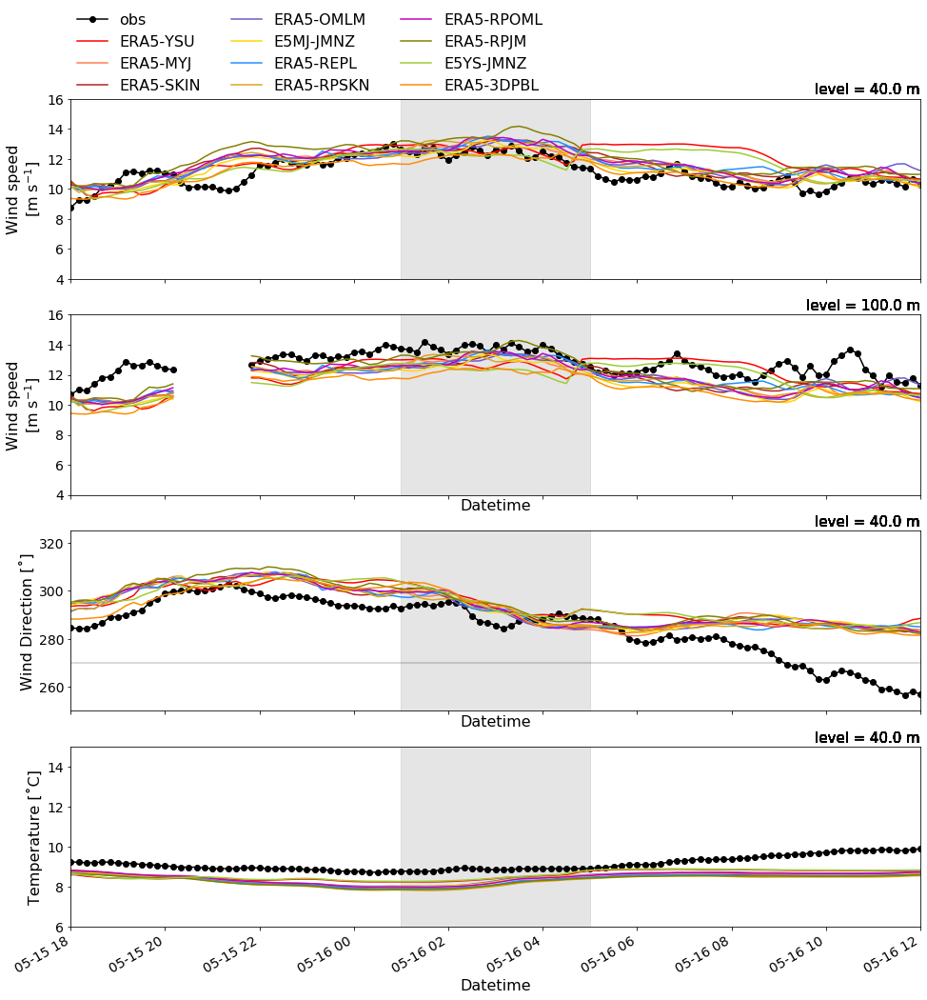

In [17]:
day_start = '2010-05-13 00:00:00'
day_end   = '2010-05-27 00:00:00'

day_start = case_days_start[0]
day_end   = case_days_end[0]

day_start = '2010-05-15 18:00:00'
day_end   = '2010-05-16 12:00:00'


TD_var = 'wspd' # wspd or temp
for ff, fino in enumerate([1]):
    fig,ax = plt.subplots(nrows=4,figsize=(16,16),sharex=True)
    ax_count = 0
    for TD_var in ['wspd','wdir','temp']:
        obs_ds = fino_obs['FINO{}'.format(fino)]
        good_lvls = []

        if TD_var == 'temp':
            levels = obs_ds.tmp_levels.values
            levels = [40.0]
            for vv,lvl in enumerate(levels):
                if len(obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                       tmp_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                    good_lvls.append(lvl)
            levels = np.unique(good_lvls)
            plt_y_label = 'Temperature [˚C]'
            plt_y_min = 6.0
            plt_y_max = 15.0
        elif TD_var == 'wdir':
            levels = obs_ds.dir_levels.values
            levels = [40.0]
            for vv,lvl in enumerate(levels):
                if len(obs_ds.wdir.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                       dir_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                    good_lvls.append(lvl)
            levels = np.unique(good_lvls)
            plt_y_label = 'Wind Direction [˚]'
            plt_y_min = 250.0
            plt_y_max = 325.0
        elif TD_var == 'wspd':
            levels = [40.0,100.0]

            obs_wdir = obs_ds.wdir
            max_pts = 0
            dir_lvl = 0
            for vv,lvl in enumerate(obs_wdir.dir_levels.values):
                dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
                num_pts = len(dir_lvl)
                if num_pts > max_pts:
                    dir_lvl = lvl
            plt_y_label = 'Wind speed\n[m s$^{-1}$]'
            plt_y_min = 4.0
            plt_y_max = 16.0


        n_levels = len(levels)
        if n_levels == 1: 
            n_levels_plt = 2
        else:
            n_levels_plt = n_levels

        for vv,lvl in enumerate(levels):
            for cc,case in enumerate(cases_of_interest):
            #for cc,case in enumerate(cases[:6]):
                twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
                if TD_var == 'temp': 
                    try:
                        twr_ds['T'] = theta_to_T(twr_ds.theta,twr_ds.pr/100.0) - 273.15
                    except AttributeError:
                        print('{} does not have pressure'.format(case))
                        twr_ds['T'] = twr_ds.theta*0.0 - 999.9
                if cc == 0:
                    if TD_var == 'temp':
                            obs = obs_ds.temp.sel(datetime=slice(day_start,day_end),
                                                                 tmp_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                                 datetime='10min').interpolate('linear')
                    elif TD_var == 'wdir':
                        obs = obs_ds.wdir.sel(datetime=slice(day_start,day_end),
                                                             dir_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                             datetime='10min').interpolate('linear')
                    elif TD_var == 'wspd':
                        obs = remove_or_replace_wake(obs_ds,lvl,start=day_start,end=day_end,remove_wake=remove_wake,
                                                                    replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                                    wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                                    wake_deg_top=wake_degs['FINO{}'.format(fino)][1])
                    nan_obs = np.where(np.isnan(obs))


                if TD_var == 'temp': 
                    sim = twr_ds.T.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').mean()
                elif TD_var == 'wspd':
                    sim = twr_ds.wspd.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').mean()   
                elif TD_var == 'wdir':
                    sim = twr_ds.wdir.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').mean()   

                if remove_wake:
                    wake_spd = sim.copy()
                    wake_spd[np.where(np.isnan(sim))] = np.nan
                    sim = wake_spd

                sim[nan_obs] = np.nan

                obs = obs.dropna(dim='datetime',how='all')
                sim = sim.dropna(dim='datetime',how='all')

                if len(obs) != len(sim):
                    sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
                if remove_mean:
                    obs = obs - lowess_mean(obs,2016/32,0)
                    sim = sim - lowess_mean(sim,2016/32,0)
                try: 
                    ax[ax_count].text(obs.datetime.data[-1],1.01*(plt_y_max-plt_y_min) + plt_y_min,
                                      'level = {} m'.format(lvl),va='bottom',size=15,ha='right')
                except:
                    print('unable to put text...')

                if cc == 0: 
                    obs.resample(datetime='10min').asfreq().plot(ax=ax[ax_count],c='k',label='obs',marker='o')
                sim.resample(datetime='10min').asfreq().plot(ax=ax[ax_count],
                                                             c=case_dict[case]['d03']['color'],
                                                             label=case_dict[case]['d03']['name'])
                ax[ax_count].tick_params(labelsize=14)
                if vv == len(levels)-1:
                    ax[ax_count].set_xlabel('Datetime',size=16)
                else:
                    ax[ax_count].set_xlabel('')
                if remove_mean: ax[ax_count].set_ylim(-5,5)
                ax[ax_count].set_title('')
                ax[ax_count].set_ylabel(plt_y_label,size=16)

                ax[ax_count].set_ylim(plt_y_min,plt_y_max)
                
                if cc == 0:
                    ax[ax_count].fill_between((pd.to_datetime('2010-05-16 01:00:00'),pd.to_datetime('2010-05-16 05:00:00')),
                                        -10,400,color='grey',alpha=0.2)
                    if TD_var == 'wdir': ax[ax_count].axhline(270.0,0,1,c='k',alpha=0.2)
                ax[ax_count].set_xlim(pd.to_datetime(day_start),pd.to_datetime(day_end))
            for day in pd.date_range(start=day_start,end=day_end):
                ax[ax_count].axvline(day,-10,400,c='k',alpha=0.2)
            ax_count += 1
        ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
        save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
        if remove_mean: save_str += '_pert'
        if remove_wake: save_str += '_nowake'
        if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    

# Rolling Stats:

In [18]:
period_int = 6  # hours between datapoints
period_len = 24 # window length
nperiods = 24/period_int

period_s = pd.to_datetime(case_days_start[0])
period_e = pd.to_datetime(case_days_end[0]) - pd.to_timedelta(24,'H')

#period_s = pd.to_datetime('2010-05-13 00:00:00')
#period_e = pd.to_datetime('2010-05-26 00:00:00')# - pd.to_timedelta(24,'H')

ndays = len(pd.date_range(start=period_s, end=period_e))
date_range = pd.date_range(start=period_s, end=period_e, periods=nperiods*(ndays-1)+1)
nperiods = len(date_range)

stats_dict = {'FN1': [],
              'FN2': [],
              'FN3': []}
for ff, fino in enumerate([1]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.spd_levels.values
    levels = [40.0,100.0]
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    
    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = {}
    sim_std_levels = {}
    sim_cor_levels = {}
    sim_rms_levels = {}

    for cc,case in enumerate(cases):
        ref_std_levels_arr = np.zeros((len(levels),nperiods))
        sim_std_levels_arr = np.zeros((len(levels),nperiods))
        sim_cor_levels_arr = np.zeros((len(levels),nperiods))
        sim_rms_levels_arr = np.zeros((len(levels),nperiods))
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]

        for vv,lvl in enumerate(levels):

            for dd,day in enumerate(date_range):
                time_s = day# - pd.to_timedelta(period_len,'H')
                #time_e = time_s + pd.to_timedelta(1,'D')
                time_e = time_s + pd.to_timedelta(period_len,'H')
                tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=time_s,end=time_e,remove_wake=remove_wake,
                                                            replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                            wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                            wake_deg_top=wake_degs['FINO{}'.format(fino)][1])   

                tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(time_s,time_e),nz=vv).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').mean()


                if remove_wake:
                    wake_spd = tay_wrf_levels[vv].copy()
                    wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                    tay_wrf_levels[vv] = wake_spd

                obs = tay_obs_levels[vv]
                sim = tay_wrf_levels[vv]

                sim[np.where(np.isnan(obs))] = np.nan
                obs = obs.dropna(dim='datetime',how='all')
                sim = sim.dropna(dim='datetime',how='all')                
                
                if len(obs) > 1:

                    if len(obs) != len(sim):
                        sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))

                    if remove_mean:
                        obs = obs - lowess_mean(obs,2016/32,0)
                        sim = sim - lowess_mean(sim,2016/32,0)

                    ref_std_levels_arr[vv,dd] = np.std(obs.data)
                    sim_std_levels_arr[vv,dd] = np.std(sim.data)
                    sim_cor_levels_arr[vv,dd],_ = pearsonr(sim, obs)
                    sim_rms_levels_arr[vv,dd] = np.sqrt( np.mean( (sim - obs)**2.0 ) )
                else:
                    ref_std_levels_arr[vv,dd] = np.nan
                    sim_std_levels_arr[vv,dd] = np.nan
                    sim_cor_levels_arr[vv,dd] = np.nan
                    sim_rms_levels_arr[vv,dd] = np.nan                   
                
        ref_std_levels[case] = ref_std_levels_arr
        sim_std_levels[case] = sim_std_levels_arr
        sim_cor_levels[case] = sim_cor_levels_arr
        sim_rms_levels[case] = sim_rms_levels_arr
              
    stats_dict['FN{}'.format(fino)] = {'ref_std': ref_std_levels,
                                       'sim_std': sim_std_levels,
                                       'sim_cor': sim_cor_levels,
                                       'sim_rms': sim_rms_levels
                                      }

    



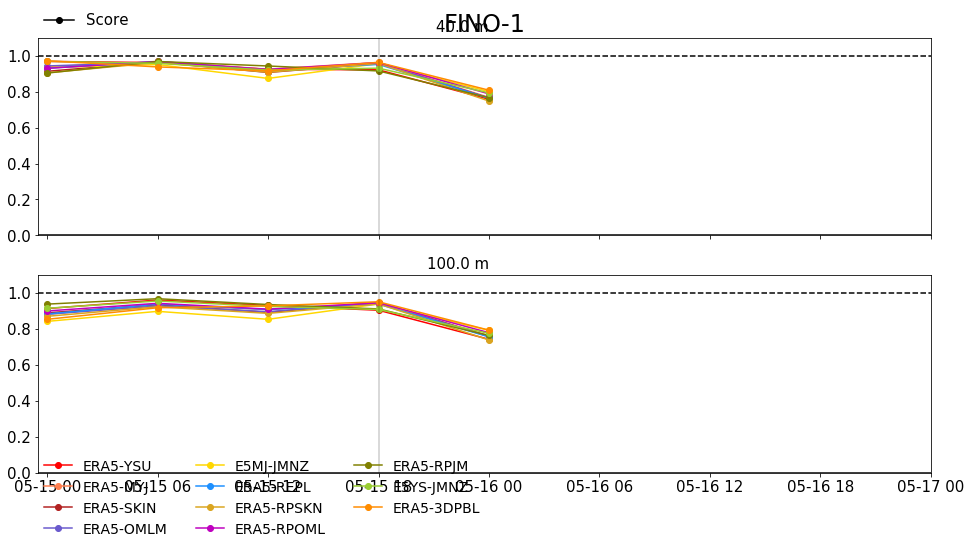

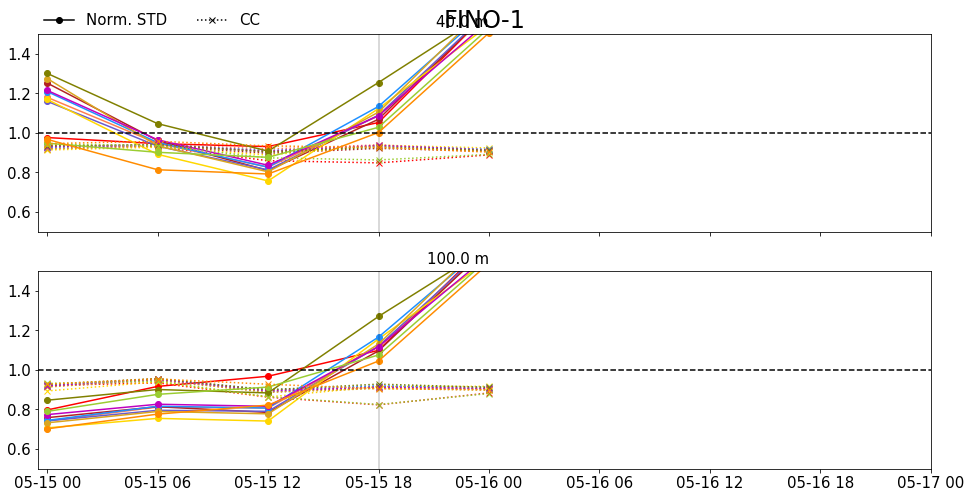

In [19]:
xlim_s = pd.to_datetime('2010-05-15 00:00:00')
xlim_e = pd.to_datetime('2010-05-17 00:00:00')

for ff, fino in enumerate([1]):
    fino_stats = stats_dict['FN{}'.format(fino)]    

    R0 = np.zeros(np.shape(fino_stats['sim_cor'][cases_of_interest[0]]))
    #for cc,case in enumerate(cases_of_interest):
    for cc,case in enumerate(cases[:6]):
        R0 += fino_stats['sim_cor'][case]
    R0 /= len(cases_of_interest)
    
    #levels_of_interest = levels[[0,round(len(levels)/2),-1]]
    
    if fino == 2:
        levels_of_interest = [42., 62., 82.,]
    else:
        levels_of_interest = [40., 100.]
    fig,ax = plt.subplots(nrows=len(levels_of_interest),figsize=(16,8),sharex=True)
    for vv,lvl in enumerate(levels_of_interest):
        
        for cc,case in enumerate(cases_of_interest):
        #for cc,case in enumerate(cases[:6]):
        #for cc,case in enumerate(cases):
            std   = fino_stats['sim_std'][case][vv,:]/fino_stats['ref_std'][case][vv,:]
            cor   = fino_stats['sim_cor'][case][vv,:]
            score = np.zeros(len(std))
            
            score = (4.0*(1.0 + cor)) / ( ((std + 1.0/std)**2)*(1.0+1.0) )

            ax[vv].plot(date_range,score,c=case_dict[case]['d03']['color'],label=case_dict[case]['d03']['name'],marker='o')
        ax[vv].set_ylim(0.0,1.1)
        ax[vv].tick_params(labelsize=15)
        ax[vv].axhline(1.0,c='k',ls='--')
        ax[vv].axhline(0.0,c='k',ls='-')
        ax[vv].text(date_range[-1],1.12,'{} m'.format(lvl),ha='right',va='bottom',size=15)
        for day in pd.date_range(start=day_start,end=day_end):
            ax[vv].axvline(day,-10,400,c='k',alpha=0.2)
    ax[0].set_title('FINO-{}'.format(fino),size=24)
    ax[1].legend(frameon=False,fontsize=14,ncol=3,loc=(0,-0.35))
    #ax[0].set_xlim(date_range[0],date_range[-1])
    ax[0].set_xlim(xlim_s-pd.to_timedelta(30,'m'),xlim_e)
    #ax[0].set_ylim(0.0,1.0)
    
    
    
    std_line = mlines.Line2D([], [], color='k', marker='o', ls='-',label='Score')
    ax[0].legend(handles=[std_line],frameon=False,fontsize=15,loc=[0.0,1.02],ncol=1)

    plt.show()
    print('\n')

for ff, fino in enumerate([1]):
    fino_stats = stats_dict['FN{}'.format(fino)]    

    #levels_of_interest = levels[[0,round(len(levels)/2),-1]]
    if fino == 2:
        levels_of_interest = [42., 62., 82.,]
    else:
        levels_of_interest = [40.,100.]
    fig,ax = plt.subplots(nrows=len(levels_of_interest),figsize=(16,8),sharex=True)
    for vv,lvl in enumerate(levels_of_interest):
        for cc,case in enumerate(cases_of_interest):
        #for cc,case in enumerate(cases[:6]):
        #for cc,case in enumerate(cases):
            reg_std_levels = fino_stats['sim_std'][case]/fino_stats['ref_std'][case]
            reg_cor_levels = fino_stats['sim_cor'][case]
            ax[vv].plot(date_range,reg_std_levels[vv,:],c=case_dict[case]['d03']['color'],
                        label=case_dict[case]['d03']['name'],marker='o')
            ax[vv].plot(date_range,reg_cor_levels[vv,:],c=case_dict[case]['d03']['color'],marker='x',ls=':')
        ax[vv].set_ylim(0.5,1.5)
        ax[vv].tick_params(labelsize=15)
        ax[vv].axhline(1.0,c='k',ls='--')
        ax[vv].axhline(0.0,c='k',ls='-')
        for day in pd.date_range(start=day_start,end=day_end):
            ax[vv].axvline(day,-10,400,c='k',alpha=0.2)
        ax[vv].text(date_range[-1],1.52,'{} m'.format(lvl),ha='right',va='bottom',size=15)
    ax[0].set_title('FINO-{}'.format(fino),size=24)
    ax[1].legend(frameon=False,fontsize=13,ncol=3,loc=3)
    #ax[0].set_xlim(date_range[0],date_range[-1])
    ax[0].set_xlim(xlim_s-pd.to_timedelta(30,'m'),xlim_e)
    #ax[0].set_ylim(0.5,1.5)
    
    
    
    std_line = mlines.Line2D([], [], color='k', marker='o', ls='-',label='Norm. STD')
    cor_line = mlines.Line2D([], [], color='k', marker='x', ls=':',label='CC')
    ax[1].legend(handles=[std_line,cor_line],frameon=False,fontsize=15,loc=[0.0,2.2],ncol=2)
    plt.show()
    print('\n')

## Find 24 hour windows of good results and a 4 hour time frame to focus on

In [20]:
poi_dict = {
            1 : {'poi_start' : '2010-05-15 12:00:00'},
    
            2 : {'poi_start' : '2010-05-19 00:00:00'}, 
    
            3 : {'poi_start' : '2010-05-25 00:00:00'}, 
}

2010-05-15 12:00:00 2010-05-16 12:00:00
ERA5_3DP_CHRN_ER5_NOSK_3DOM does not have pressure... filling with missing


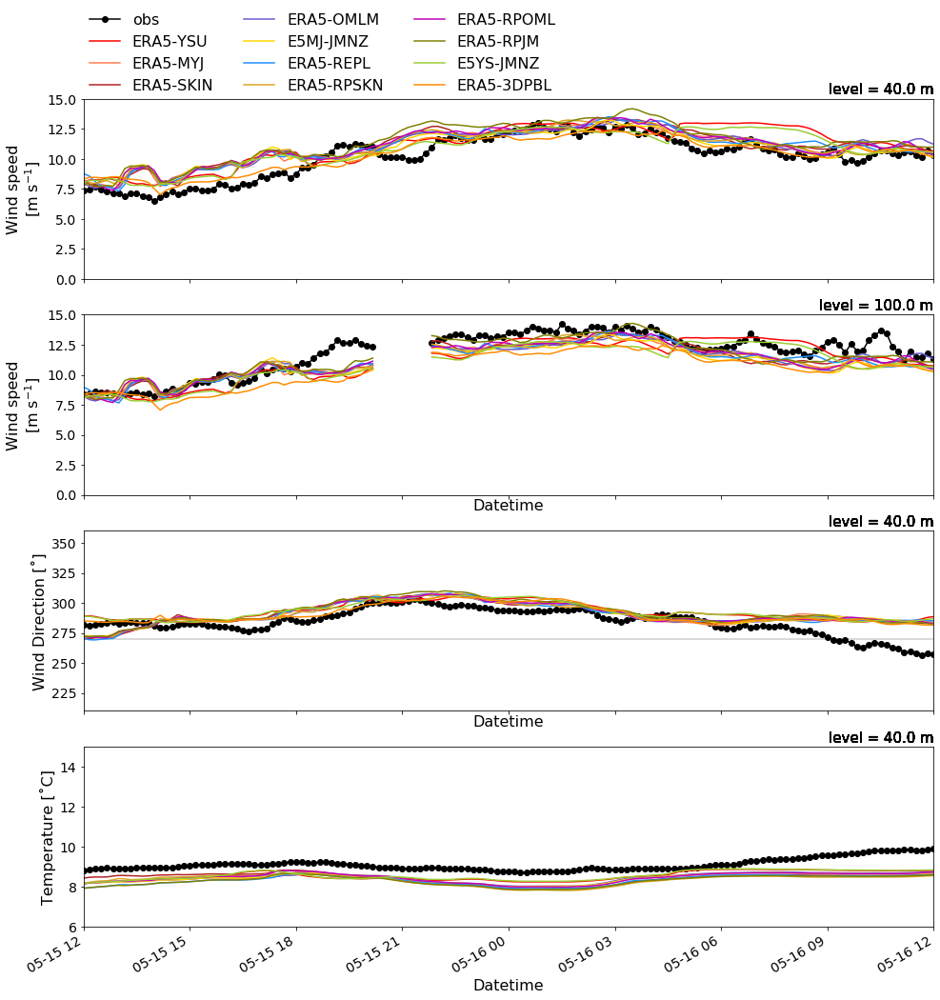

In [21]:
for poi in list(poi_dict.keys())[:1]:
    poi_start = pd.to_datetime(poi_dict[poi]['poi_start'])
    poi_end   = poi_start + pd.to_timedelta(24,'h')
    print(poi_start,poi_end)
    #hr4_start = pd.to_datetime(poi_dict[poi]['fourHR_s'])
    #hr4_end   = hr4_start + pd.to_timedelta(4,'h')

    TD_var = 'wspd' # wspd or temp
    for ff, fino in enumerate([1]):
        fig,ax = plt.subplots(nrows=4,figsize=(16,16),sharex=True)
        ax_count = 0
        for TD_var in ['wspd','wdir','temp']:
            obs_ds = fino_obs['FINO{}'.format(fino)]
            good_lvls = []

            if TD_var == 'temp':
                levels = obs_ds.tmp_levels.values
                levels = [40.0]
                for vv,lvl in enumerate(levels):
                    if len(obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                           tmp_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                        good_lvls.append(lvl)
                levels = np.unique(good_lvls)
                plt_y_label = 'Temperature [˚C]'
                plt_y_min = 6.0
                plt_y_max = 15.0
            elif TD_var == 'wdir':
                levels = obs_ds.dir_levels.values
                levels = [40.0]
                for vv,lvl in enumerate(levels):
                    if len(obs_ds.wdir.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                           dir_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                        good_lvls.append(lvl)
                levels = np.unique(good_lvls)
                plt_y_label = 'Wind Direction [˚]'
                plt_y_min = 210.0
                plt_y_max = 360.0
            elif TD_var == 'wspd':
                levels = [40.0,100.0]

                obs_wdir = obs_ds.wdir
                max_pts = 0
                dir_lvl = 0
                for vv,lvl in enumerate(obs_wdir.dir_levels.values):
                    dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
                    num_pts = len(dir_lvl)
                    if num_pts > max_pts:
                        dir_lvl = lvl
                plt_y_label = 'Wind speed\n[m s$^{-1}$]'
                plt_y_min = 0.0
                plt_y_max = 15.0


            n_levels = len(levels)
            if n_levels == 1: 
                n_levels_plt = 2
            else:
                n_levels_plt = n_levels

            for vv,lvl in enumerate(levels):
                for cc,case in enumerate(cases_of_interest):
                #for cc,case in enumerate(cases[:6]):
                    twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
                    if TD_var == 'temp': 
                        try:
                            twr_ds['T'] = theta_to_T(twr_ds.theta,twr_ds.pr/100.0) - 273.15
                        except AttributeError:
                            print('{} does not have pressure... filling with missing'.format(case))
                            twr_ds['T'] = twr_ds.theta*0.0 - 999.9

                    if cc == 0:
                        if TD_var == 'temp':
                            obs = obs_ds.temp.sel(datetime=slice(str(poi_start),str(poi_end)),
                                                                 tmp_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                                 datetime='10min').interpolate('linear')
                        elif TD_var == 'wdir':
                            obs = obs_ds.wdir.sel(datetime=slice(str(poi_start),str(poi_end)),
                                                                 dir_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                                 datetime='10min').interpolate('linear')
                        elif TD_var == 'wspd':
                            obs = remove_or_replace_wake(obs_ds,lvl,start=str(poi_start),end=str(poi_end),remove_wake=remove_wake,
                                                                        replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                                        wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                                        wake_deg_top=wake_degs['FINO{}'.format(fino)][1])                
                        nan_obs = np.where(np.isnan(obs))


                    if TD_var == 'temp': 
                        sim = twr_ds.T.sel(datetime=slice(str(poi_start),str(poi_end)),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()
                    elif TD_var == 'wspd':
                        sim = twr_ds.wspd.sel(datetime=slice(str(poi_start),str(poi_end)),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()   
                    elif TD_var == 'wdir':
                        sim = twr_ds.wdir.sel(datetime=slice(str(poi_start),str(poi_end)),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()   

                    if remove_wake:
                        wake_spd = sim.copy()
                        wake_spd[np.where(np.isnan(sim))] = np.nan
                        sim = wake_spd

                    sim[nan_obs] = np.nan

                    obs = obs.dropna(dim='datetime',how='all')
                    sim = sim.dropna(dim='datetime',how='all')


                    if len(obs) != len(sim):
                        sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
                    if remove_mean:
                        obs = obs - lowess_mean(obs,2016/32,0)
                        sim = sim - lowess_mean(sim,2016/32,0)
                    try: 
                        ax[ax_count].text(obs.datetime.data[-1],1.01*(plt_y_max-plt_y_min) + plt_y_min,
                                          'level = {} m'.format(lvl),va='bottom',size=15,ha='right')
                    except:
                        print('unable to put text...')

                    if cc == 0: 
                        obs.resample(datetime='10min').asfreq().plot(ax=ax[ax_count],c='k',label='obs',marker='o')
                    sim.resample(datetime='10min').asfreq().plot(ax=ax[ax_count],
                                                                 c=case_dict[case]['d03']['color'],
                                                                 label=case_dict[case]['d03']['name'])
                    ax[ax_count].tick_params(labelsize=14)
                    if vv == len(levels)-1:
                        ax[ax_count].set_xlabel('Datetime',size=16)
                    else:
                        ax[ax_count].set_xlabel('')
                    if remove_mean: ax[ax_count].set_ylim(-5,5)
                    ax[ax_count].set_title('')
                    ax[ax_count].set_ylabel(plt_y_label,size=16)

                    ax[ax_count].set_ylim(plt_y_min,plt_y_max)
                    if cc == 0:
                        #ax[ax_count].fill_between((hr4_start,hr4_end),-10,400,color='grey',alpha=0.2)
                        if TD_var == 'wdir': ax[ax_count].axhline(270.0,0,1,c='k',alpha=0.2)
                    ax[ax_count].set_xlim(poi_start,poi_end)
                ax_count += 1
            ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
            save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
            if remove_mean: save_str += '_pert'
            if remove_wake: save_str += '_nowake'
            if save_figs: plt.savefig('{}.png'.format(save_str))
        plt.show()
    

    
    period_int = 1  # hours between datapoints
    period_len = 4 # window length
    nperiods = 24/period_int

    period_s = pd.to_datetime(poi_dict[poi]['poi_start'])
    period_e = period_s + pd.to_timedelta(23,'H')


    date_range = pd.date_range(start=period_s, end=period_e, periods=nperiods)

    nperiods = len(date_range)

    stats_dict = {'FN1': [],
                  'FN2': [],
                  'FN3': []}
    for ff, fino in enumerate([1]):
        obs_ds = fino_obs['FINO{}'.format(fino)]
        levels = obs_ds.spd_levels.values
        levels = [40.0,100.0]
        obs_wdir = obs_ds.wdir
        max_pts = 0
        dir_lvl = 0
        for vv,lvl in enumerate(obs_wdir.dir_levels.values):
            dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
            num_pts = len(dir_lvl)
            if num_pts > max_pts:
                dir_lvl = lvl

        tay_obs_levels = [[[]]*len(levels)][0]
        ref_std_levels = {}
        sim_std_levels = {}
        sim_cor_levels = {}
        sim_rms_levels = {}

        for cc,case in enumerate(cases):
        #for cc,case in enumerate(cases_of_interest):
            ref_std_levels_arr = np.zeros((len(levels),nperiods))
            sim_std_levels_arr = np.zeros((len(levels),nperiods))
            sim_cor_levels_arr = np.zeros((len(levels),nperiods))
            sim_rms_levels_arr = np.zeros((len(levels),nperiods))
            twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
            tay_wrf_levels = [[[]]*len(levels)][0]

            for vv,lvl in enumerate(levels):

                for dd,day in enumerate(date_range):
                    time_s = day# - pd.to_timedelta(period_len,'H')
                    #time_e = time_s + pd.to_timedelta(1,'D')
                    time_e = time_s + pd.to_timedelta(period_len,'H')
                    tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=time_s,end=time_e,remove_wake=remove_wake,
                                                                replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                                wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                                wake_deg_top=wake_degs['FINO{}'.format(fino)][1])   

                    tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(time_s,time_e),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()


                    if remove_wake:
                        wake_spd = tay_wrf_levels[vv].copy()
                        wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                        tay_wrf_levels[vv] = wake_spd

                    obs = tay_obs_levels[vv]
                    sim = tay_wrf_levels[vv]

                    sim[np.where(np.isnan(obs))] = np.nan
                    obs = obs.dropna(dim='datetime',how='all')
                    sim = sim.dropna(dim='datetime',how='all')                

                    if len(obs) > 1:

                        if len(obs) != len(sim):
                            sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))

                        if remove_mean:
                            obs = obs - lowess_mean(obs,2016/32,0)
                            sim = sim - lowess_mean(sim,2016/32,0)

                        ref_std_levels_arr[vv,dd] = np.std(obs.data)
                        sim_std_levels_arr[vv,dd] = np.std(sim.data)
                        sim_cor_levels_arr[vv,dd],_ = pearsonr(sim, obs)
                        sim_rms_levels_arr[vv,dd] = np.sqrt( np.mean( (sim - obs)**2.0 ) )
                    else:
                        ref_std_levels_arr[vv,dd] = np.nan
                        sim_std_levels_arr[vv,dd] = np.nan
                        sim_cor_levels_arr[vv,dd] = np.nan
                        sim_rms_levels_arr[vv,dd] = np.nan                   

            ref_std_levels[case] = ref_std_levels_arr
            sim_std_levels[case] = sim_std_levels_arr
            sim_cor_levels[case] = sim_cor_levels_arr
            sim_rms_levels[case] = sim_rms_levels_arr

        stats_dict['FN{}'.format(fino)] = {'ref_std': ref_std_levels,
                                           'sim_std': sim_std_levels,
                                           'sim_cor': sim_cor_levels,
                                           'sim_rms': sim_rms_levels
                                          }

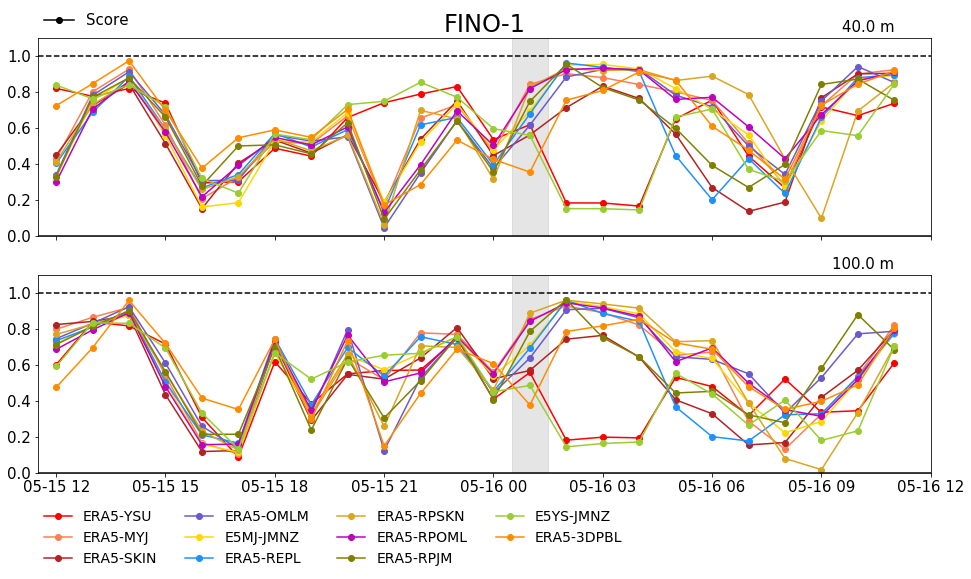

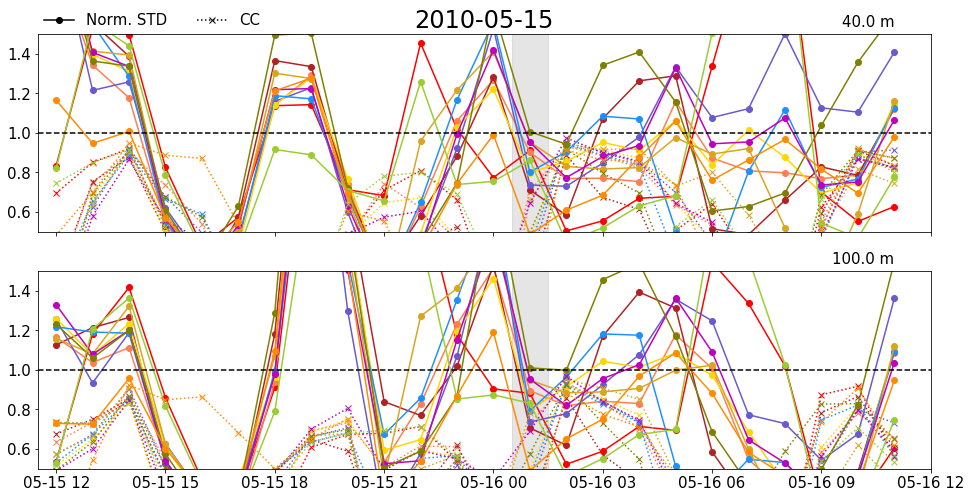

In [22]:
    xlim_s = period_s

    xlim_e = period_s + pd.to_timedelta(24,'H')


    for ff, fino in enumerate([1]):
        fino_stats = stats_dict['FN{}'.format(fino)]    

        R0 = np.zeros(np.shape(fino_stats['sim_cor'][cases_of_interest[0]]))
        #for cc,case in enumerate(cases_of_interest):
        for cc,case in enumerate(cases[:6]):
            R0 += fino_stats['sim_cor'][case]
        R0 /= len(cases_of_interest)

        #levels_of_interest = levels[[0,round(len(levels)/2),-1]]

        if fino == 2:
            levels_of_interest = [42., 62., 82.,]
        else:
            levels_of_interest = [40., 100.]
        fig,ax = plt.subplots(nrows=len(levels_of_interest),figsize=(16,8),sharex=True)
        for vv,lvl in enumerate(levels_of_interest):

            for cc,case in enumerate(cases_of_interest):
            #for cc,case in enumerate(cases[:6]):
            #for cc,case in enumerate(cases):
                std   = fino_stats['sim_std'][case][vv,:]/fino_stats['ref_std'][case][vv,:]
                cor   = fino_stats['sim_cor'][case][vv,:]
                score = np.zeros(len(std))

                score = (4.0*(1.0 + cor)) / ( ((std + 1.0/std)**2)*(1.0+1.0) )

                ax[vv].plot(date_range,score,c=case_dict[case]['d03']['color'],label=case_dict[case]['d03']['name'],marker='o')
            ax[vv].set_ylim(0.0,1.1)
            ax[vv].tick_params(labelsize=15)
            ax[vv].axhline(1.0,c='k',ls='--')
            ax[vv].axhline(0.0,c='k',ls='-')
            #for day in pd.date_range(start=day_start,end=day_end):
            #    ax[vv].axvline(day,-10,400,c='k',alpha=0.2)
            ax[vv].fill_between((pd.to_datetime('2010-05-16 00:30:00'),pd.to_datetime('2010-05-16 01:30:00')),
                                -10,400,color='grey',alpha=0.2)
            ax[vv].text(date_range[-1],1.12,'{} m'.format(lvl),ha='right',va='bottom',size=15)
        ax[0].set_title('FINO-{}'.format(fino),size=24)
        ax[1].legend(frameon=False,fontsize=14,ncol=4,loc=(0.0,-0.5))
        #ax[0].set_xlim(date_range[0],date_range[-1])
        ax[0].set_xlim(xlim_s-pd.to_timedelta(30,'m'),xlim_e)
        #ax[0].set_ylim(0.0,1.0)



        std_line = mlines.Line2D([], [], color='k', marker='o', ls='-',label='Score')
        ax[0].legend(handles=[std_line],frameon=False,fontsize=15,loc=[0.0,1.02],ncol=1)

        plt.show()
        print('\n')

    for ff, fino in enumerate([1]):
        fino_stats = stats_dict['FN{}'.format(fino)]    

        #levels_of_interest = levels[[0,round(len(levels)/2),-1]]
        if fino == 2:
            levels_of_interest = [42., 62., 82.,]
        else:
            levels_of_interest = [40.,100.]
        fig,ax = plt.subplots(nrows=len(levels_of_interest),figsize=(16,8),sharex=True)
        for vv,lvl in enumerate(levels_of_interest):
            for cc,case in enumerate(cases_of_interest):
            #for cc,case in enumerate(cases[:6]):
            #for cc,case in enumerate(cases):
                reg_std_levels = fino_stats['sim_std'][case]/fino_stats['ref_std'][case]
                reg_cor_levels = fino_stats['sim_cor'][case]
                ax[vv].plot(date_range,reg_std_levels[vv,:],c=case_dict[case]['d03']['color'],
                            label=case_dict[case]['d03']['name'],marker='o')
                ax[vv].plot(date_range,reg_cor_levels[vv,:],c=case_dict[case]['d03']['color'],marker='x',ls=':')
            ax[vv].set_ylim(0.5,1.5)
            ax[vv].tick_params(labelsize=15)
            ax[vv].axhline(1.0,c='k',ls='--')
            ax[vv].axhline(0.0,c='k',ls='-')
            #for day in pd.date_range(start=day_start,end=day_end):
            #    ax[vv].axvline(day,-10,400,c='k',alpha=0.2)

            ax[vv].fill_between((pd.to_datetime('2010-05-16 00:30:00'),pd.to_datetime('2010-05-16 01:30:00')),
                                -10,400,color='grey',alpha=0.2)
            ax[vv].text(date_range[-1],1.52,'{} m'.format(lvl),ha='right',va='bottom',size=15)
        ax[0].set_title('{0:04d}-{1:02d}-{2:02d}'.format(period_s.year,period_s.month,period_s.day),size=24)
        ax[1].legend(frameon=False,fontsize=13,ncol=3,loc=3)
        #ax[0].set_xlim(date_range[0],date_range[-1])
        ax[0].set_xlim(xlim_s-pd.to_timedelta(30,'m'),xlim_e)
        #ax[0].set_ylim(0.5,1.5)



        std_line = mlines.Line2D([], [], color='k', marker='o', ls='-',label='Norm. STD')
        cor_line = mlines.Line2D([], [], color='k', marker='x', ls=':',label='CC')
        ax[1].legend(handles=[std_line,cor_line],frameon=False,fontsize=15,loc=[0.0,2.2],ncol=2)
        plt.show()
        print('\n')

# Subset of period TDs

In [23]:
cases_of_interest = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_ER5_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_ER5_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_NOSK_3DOM',
                     'ERA5_MYJ_CHRN_OVT_SKNT_3DOM',
                     'ERA5_MYJ_CHRN_OVT_OMLM_3DOM',
                     'ERA5_MYJ_JMNZ_OVT_NOSK_3DOM',
                     'ERA5_YSU_JMNZ_ER5_NOSK_3DOM',
                     'ERA5_3DP_CHRN_ER5_NOSK_3DOM'
                    ]

ERA5_3DP_CHRN_ER5_NOSK_3DOM does not have pressure... filling with missing


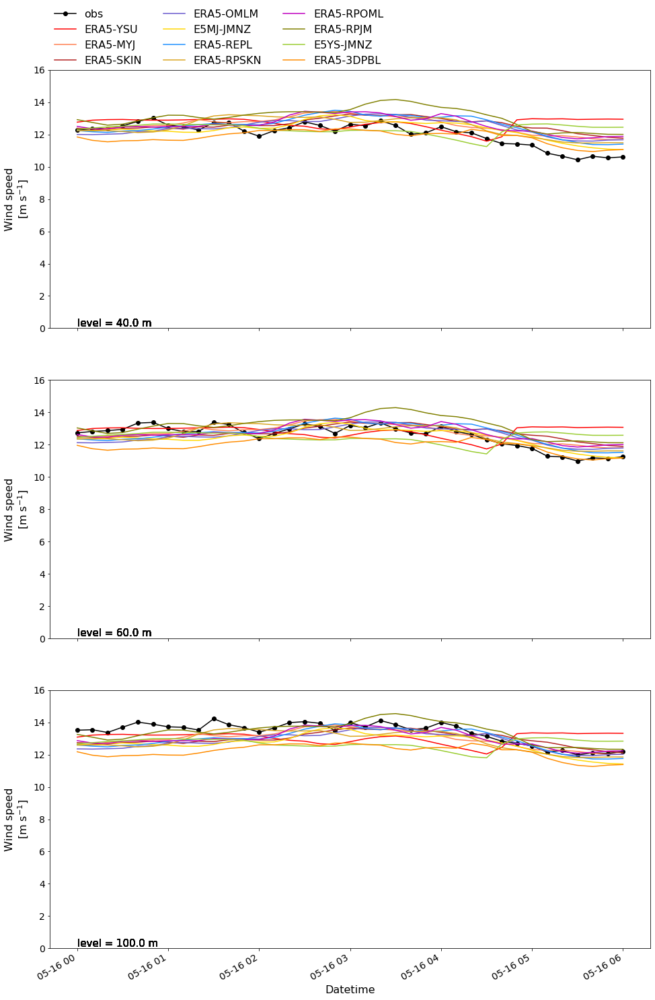

Note: (0.357555,-0.131835) not shown for R2 < 0, set extend=True
Note: (0.34981,-0.19552) not shown for R2 < 0, set extend=True
Note: (0.331861,-0.269692) not shown for R2 < 0, set extend=True
Note: (0.49393,-0.199349) not shown for R2 < 0, set extend=True
Note: (0.329528,-0.102733) not shown for R2 < 0, set extend=True
Note: (0.321647,-0.167954) not shown for R2 < 0, set extend=True
Note: (0.302074,-0.258713) not shown for R2 < 0, set extend=True
Note: (0.452958,-0.176851) not shown for R2 < 0, set extend=True


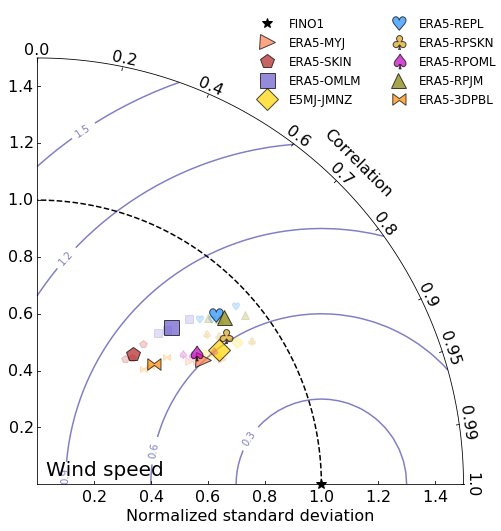

ERA5_3DP_CHRN_ER5_NOSK_3DOM does not have pressure... filling with missing


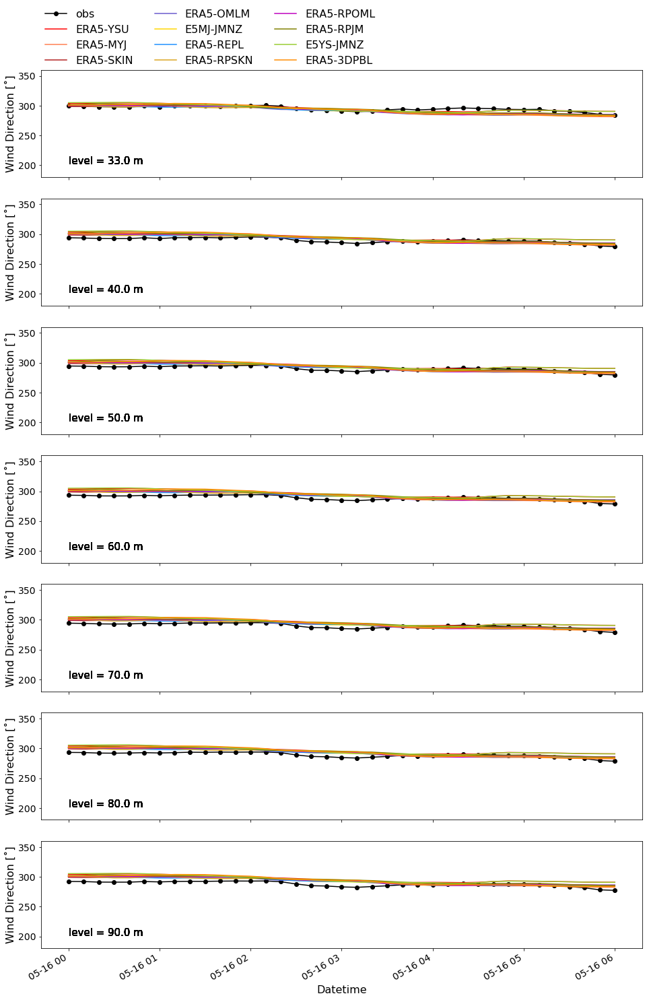

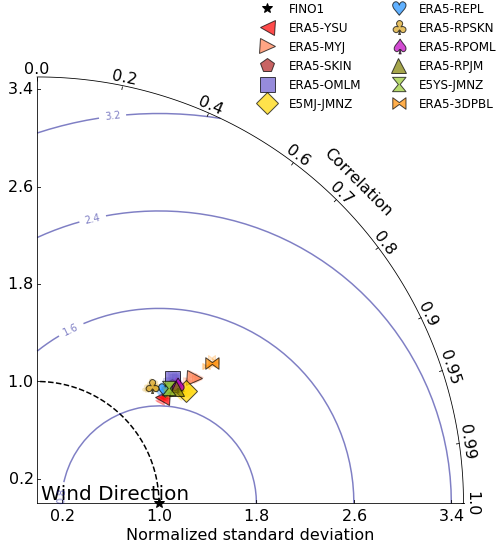

ERA5_3DP_CHRN_ER5_NOSK_3DOM does not have pressure... filling with missing


/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/scipy/stats/stats.py:3538: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficent may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())
/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/scipy/stats/stats.py:3538: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficent may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())
/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/scipy/stats/stats.py:3538: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficent may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())
/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/scipy/stats/stats.py:3538: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coeffi

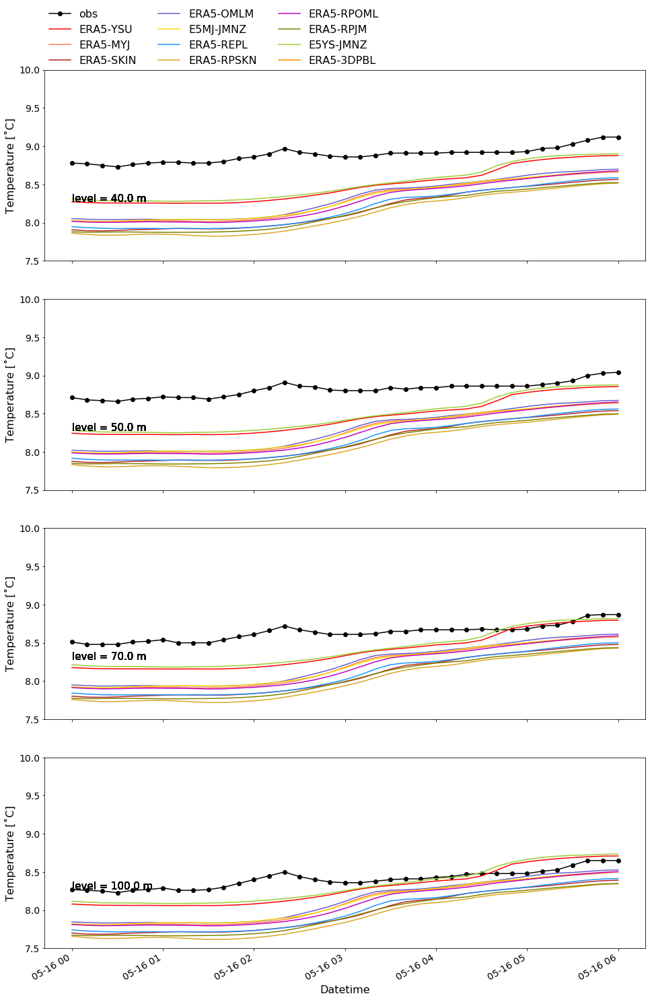

Note: (1.13687e-13,-0.129238) not shown for R2 < 0, set extend=True
Note: (1.13687e-13,-0.125562) not shown for R2 < 0, set extend=True
Note: (1.13687e-13,-0.121387) not shown for R2 < 0, set extend=True
Note: (1.13687e-13,-0.112902) not shown for R2 < 0, set extend=True
Note: (1.09706e-12,-0.122274) not shown for R2 < 0, set extend=True


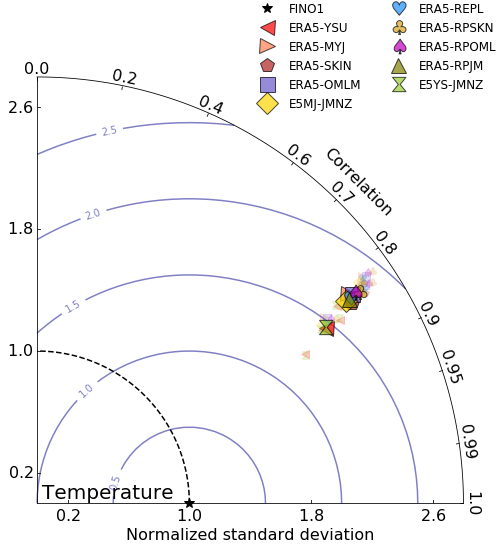

In [24]:
for poi in list(poi_dict.keys())[:1]:
    poi_start = pd.to_datetime(poi_dict[poi]['poi_start'])
    poi_start = pd.to_datetime('2010-05-16')
    poi_end   = poi_start + pd.to_timedelta(6,'h')
    day_start = str(poi_start)
    day_end   = str(poi_end)
    TD_var = 'wspd' # wspd or temp
    for ff, fino in enumerate([1]):
        for TD_var in ['wspd','wdir','temp']:
            obs_ds = fino_obs['FINO{}'.format(fino)]
            good_lvls = []

            if TD_var == 'temp':
                levels = obs_ds.tmp_levels.values
                for vv,lvl in enumerate(levels):
                    if len(obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                           tmp_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                        good_lvls.append(lvl)
                levels = np.unique(good_lvls)
                plt_y_label = 'Temperature [˚C]'
                plt_str     = 'Temperature'
                plt_y_min = 7.5
                plt_y_max = 10.0
            elif TD_var == 'wdir':
                levels = obs_ds.dir_levels.values
                for vv,lvl in enumerate(levels):
                    if len(obs_ds.wdir.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                           dir_levels=lvl).dropna(how='all',dim='datetime')) > 1:
                        good_lvls.append(lvl)
                levels = np.unique(good_lvls)
                plt_y_label = 'Wind Direction [˚]'
                plt_str     = 'Wind Direction'
                plt_y_min = 180.0
                plt_y_max = 360.0
            elif TD_var == 'wspd':
                levels = obs_ds.spd_levels.values
                levels = [40.0,60.0,100.0]
                obs_wdir = obs_ds.wdir
                max_pts = 0
                dir_lvl = 0
                for vv,lvl in enumerate(obs_wdir.dir_levels.values):
                    dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
                    num_pts = len(dir_lvl)
                    if num_pts > max_pts:
                        dir_lvl = lvl
                plt_y_label = 'Wind speed\n[m s$^{-1}$]'
                plt_str     = 'Wind speed'
                plt_y_min = 0.0
                plt_y_max = 16.0

            tay_obs_levels = [[[]]*len(levels)][0]
            rms_levels = np.zeros((ncases,len(levels)))
            ref_std_levels = np.zeros((ncases,len(levels)))
            sim_std_levels = np.zeros((ncases,len(levels)))
            sim_cor_levels = np.zeros((ncases,len(levels)))
            fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)
            for cc,case in enumerate(cases_of_interest):
            #for cc,case in enumerate(cases):
                twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
                tay_wrf_levels = [[[]]*len(levels)][0]
                try:
                    twr_ds['T'] = theta_to_T(twr_ds.theta,twr_ds.pr/100.0) - 273.15
                except AttributeError:
                    print('{} does not have pressure... filling with missing'.format(case))
                    twr_ds['T'] = twr_ds.theta*0.0 - 999.9
                for vv,lvl in enumerate(levels):
                    if cc == 0:
                        if TD_var == 'temp':
                            tay_obs_levels[vv] = obs_ds.temp.sel(datetime=slice(day_start,day_end),
                                                                 tmp_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                                 datetime='10min').interpolate('linear')
                        elif TD_var == 'wdir':
                            tay_obs_levels[vv] = obs_ds.wdir.sel(datetime=slice(day_start,day_end),
                                                                 dir_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                                 datetime='10min').interpolate('linear')
                        elif TD_var == 'wspd':
                            tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=day_start,end=day_end,remove_wake=remove_wake,
                                                                        replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                                        wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                                        wake_deg_top=wake_degs['FINO{}'.format(fino)][1])                


                    if TD_var == 'temp': 
                        tay_wrf_levels[vv] = twr_ds.T.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()
                    elif TD_var == 'wdir': 
                        tay_wrf_levels[vv] = twr_ds.wdir.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()
                    elif TD_var == 'wspd':
                        tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').mean()                

                    if remove_wake:
                        wake_spd = tay_wrf_levels[vv].copy()
                        wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                        tay_wrf_levels[vv] = wake_spd

                    obs = tay_obs_levels[vv]
                    sim = tay_wrf_levels[vv]

                    sim[np.where(np.isnan(obs))] = np.nan
                    obs = obs.dropna(dim='datetime',how='all')
                    sim = sim.dropna(dim='datetime',how='all')

                    if len(obs) != len(sim):
                        sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
                    if remove_mean:
                        obs = obs - lowess_mean(obs,2016/32,0)
                        sim = sim - lowess_mean(sim,2016/32,0)
                    ax[vv].text(obs.datetime.data[0],1.1*plt_y_min,'level = {} m'.format(lvl),va='bottom',size=15,ha='left')

                    if cc == 0: 
                        obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs',marker='o')
                    sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],
                                                                 c=case_dict[case]['d03']['color'],
                                                                 label=case_dict[case]['d03']['name'])
                    ax[vv].tick_params(labelsize=14)
                    if vv == len(levels)-1:
                        ax[vv].set_xlabel('Datetime',size=16)
                    else:
                        ax[vv].set_xlabel('')
                    if remove_mean: ax[vv].set_ylim(-5,5)
                    ax[vv].set_title('')
                    ax[vv].set_ylabel(plt_y_label,size=16)
                    ref_std_levels[cc,vv] = np.std(obs.data)
                    sim_std_levels[cc,vv] = np.std(sim.data)
                    sim_cor_levels[cc,vv],_ = pearsonr(sim, obs)
                    rms_levels[cc,vv] = (sim_std_levels[cc,vv]/ref_std_levels[cc,vv])**2 + 1.0 - \
                                        2.0*sim_cor_levels[cc,vv]*(sim_std_levels[cc,vv]/ref_std_levels[cc,vv])
                    rms_levels[cc,vv] = (np.sqrt(np.mean( ((sim.data-np.mean(sim.data)) - (obs.data-np.mean(obs.data)))**2 )) / \
                                         ref_std_levels[cc,vv])**2.0
                    ax[vv].set_ylim(plt_y_min,plt_y_max)
            ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
            save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
            if remove_mean: save_str += '_pert'
            if remove_wake: save_str += '_nowake'
            if save_figs: plt.savefig('{}.png'.format(save_str))
            plt.show()


            fig_tay = plt.figure(figsize=(8,8))  
            if TD_var == 'wdir':
                srange=[0.0,3.5]
                stdevticks=np.arange(0.2,5.6,0.8)
                extend_TD = False
            elif TD_var == 'temp':
                srange=[0.0,2.8]
                stdevticks=np.arange(0.2,5.6,0.8)
                extend_TD = False
            else:
                srange=[0.0,1.5]
                stdevticks=np.arange(0.2,5.6,0.2)
                extend_TD = False
                
            dia = TaylorDiagram(1.0, fig=fig_tay, 
                                extend=extend_TD,
                                label='FINO{}'.format(fino),
                                normalize=True,
                                srange=srange,
                                stdevticks=stdevticks,
                                labelsize=16)

            td_stats = {}
            for cc,case in enumerate(cases_of_interest):
            #for cc,case in enumerate(cases):
                td_stats[case] = pd.DataFrame(index=levels, columns=['std_norm','R2'], dtype=float) 

                markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

                for vv,lvl in enumerate(levels):
                    td_stats[case].loc[lvl,'std_norm'] = sim_std_levels[cc,vv]/ref_std_levels[cc,vv]
                    td_stats[case].loc[lvl,'R2'] = sim_cor_levels[cc,vv]

                    dia.set_ref(ref_std_levels[cc,vv])
                    if cc == 0:
                        label_str = '{}'.format(lvl)
                    else:
                        label_str = None
                    dia.add_sample(sim_std_levels[cc,vv], sim_cor_levels[cc,vv],
                                   marker=case_dict[case]['d03']['marker'], ms=8, ls='',
                                   mfc=case_dict[case]['d03']['color'], 
                                   mec=case_dict[case]['d03']['color'], # Colors
                                   #label=case_dict[case]['d03']['name'],
                                   zorder=cc,alpha=0.2)
                #plt.text(0.01,0.01+0.04*cc,case,color=case_dict[case]['d03']['color'],ha='left',va='bottom',size=16)
                td_stats[case]['angle'] = np.arccos(td_stats[case]['R2'])
                td_mean = td_stats[case].mean(axis=0)
                dia.add_sample(td_mean['std_norm'], np.cos(td_mean['angle']),
                       norm=False, # don't normalize this point
                       marker=case_dict[case]['d03']['marker'], ms=15, ls='',
                       mfc=case_dict[case]['d03']['color'], mec='k', # Colors
                       label=case_dict[case]['d03']['name'],
                       zorder=cc+3,alpha=0.7)
            contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
            dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
            if extend_TD:
                leg_loc = (0.2,0.8)
                leg_ncol = 3
            else:
                leg_loc = (0.50,0.79)
                leg_ncol = 2
            fig_tay.legend(frameon=False,loc=leg_loc,fontsize=12,ncol=leg_ncol)
            save_str = '{}/img/TD_FINO{}'.format(wrf_dir,fino)
            if remove_mean: save_str += '_pert'
            if remove_wake: save_str += '_nowake'
            if save_figs: plt.savefig('{}.png'.format(save_str))
            plt.text(0.03,0.03,plt_str,size=20)
            plt.show()

            


    
    

# WRFOUT Comparison

In [25]:
wrfout_f_dict = {}
for cc,case in enumerate(cases):
    wrfout_f_dict[case] = sorted(glob.glob('{}{}/{}/wrfout_d03*'.format(wrf_dir,cases[cc],restarts[0])))

In [26]:
cases_of_interest = ['ERA5_MYJ_CHRN_ER5_NOSK_3DOM',
                     'ERA5_MYJ_JMNZ_ER5_NOSK_3DOM']

In [27]:
wrf_input = np.squeeze(xr.open_dataset('{}{}/{}/wrfinput_d03'.format(wrf_dir,cases_of_interest[0],restarts[0])))

In [28]:
land_mask = wrf_input.LANDMASK
lat = wrf_input.XLAT
lon = wrf_input.XLONG

In [29]:
case_wspd = {}
case_z0   = {}
for cc,case in enumerate(cases_of_interest):
    case_wspd[case] = {}
    case_z0[case]   = {}
    for ff,wrfout_f in enumerate(wrfout_f_dict[case][12:]):
        wrfout = np.squeeze(xr.open_dataset(wrfout_f))
        case_z0[case][ff]   = wrfout.ZNT.where(land_mask==0.0)
        case_wspd[case][ff] = (wrfout.U10.where(land_mask==0.0)**2 + wrfout.V10.where(land_mask==0.0)**2)**0.5


In [30]:
mean_z0   = {}
mean_wspd = {}
for cc,case in enumerate(cases_of_interest):
    for ff,wrfout_f in enumerate(wrfout_f_dict[case][12:]):
        if ff == 0:
            mean_wspd0 = case_wspd[case][ff]
            mean_z00   = case_z0[case][ff]
        else:
            mean_wspd0 += case_wspd[case][ff]
            mean_z00   += case_z0[case][ff]
    mean_wspd[case] = mean_wspd0/ff
    mean_z0[case]   = mean_z00/ff


0.0005450401
2.2462957e-05
0.0038754868
8.193423e-05


/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


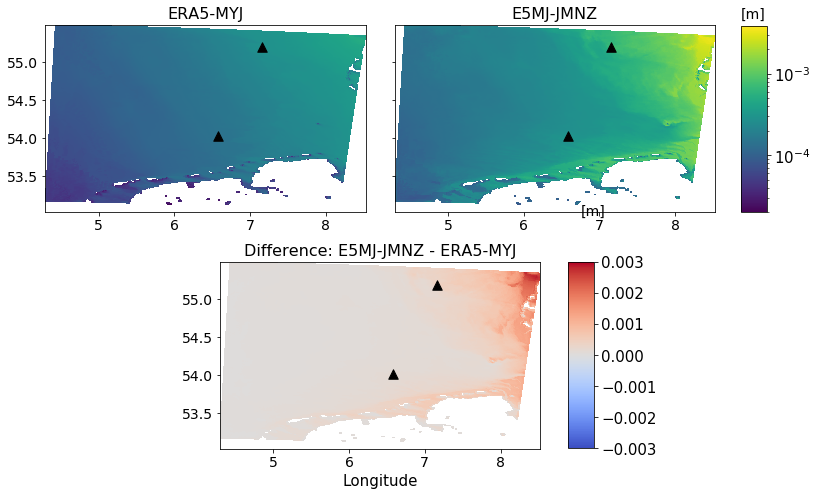

In [81]:
fig = plt.figure(figsize=(12,8))
for cc,case in enumerate(cases_of_interest):
    print(np.nanmax(mean_z0[case]))
    print(np.nanmin(mean_z0[case]))
    plt.subplot2grid((2,4), (0,cc*2),aspect='equal',colspan=2)
    z0_plt = plt.pcolormesh(lon,lat,mean_z0[case],norm=colors.LogNorm(2.0e-5,0.0039))
    plt.title(case_dict[case]['d03']['name'],size=16)
    plt.tick_params(labelsize=14)
    plt.xlabel('')
    if cc != 0: plt.tick_params(labelleft=False)

    for ff,fino in enumerate([1,3]):
        plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                    wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                    marker='^',zorder=3,color='k',s=90)
        
z0_ax   = fig.add_axes([0.93, 0.545, 0.03, 0.324])
z0_cbar = fig.colorbar(z0_plt, cax=z0_ax)
z0_ax.text(2.0e-5,0.0048,'[m]',size=14)
z0_ax.tick_params(labelsize=15)

plt.subplot2grid((2,4), (1,1),aspect='equal',colspan=2)

diff_plt = plt.pcolormesh(lon,lat,(mean_z0[cases_of_interest[1]] - mean_z0[cases_of_interest[0]]),
                            cmap=plt.cm.coolwarm,norm=Normalize(-0.003,0.003))

plt.xlabel('Longitude',size=15)
plt.tick_params(labelsize=14)

for ff,fino in enumerate([1,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)

plt.title('Difference: {} - {}'.format(case_dict[cases_of_interest[1]]['d03']['name'],
                                             case_dict[cases_of_interest[0]]['d03']['name']),size=16)
diff_ax   = fig.add_axes([0.73, 0.135, 0.03, 0.324])
diff_cbar = fig.colorbar(diff_plt, cax=diff_ax)
diff_ax.text(2.0e-6,0.0045,'[m]',size=14)
diff_ax.tick_params(labelsize=15)

0.0005450401
2.2462957e-05
0.0038754868
8.193423e-05


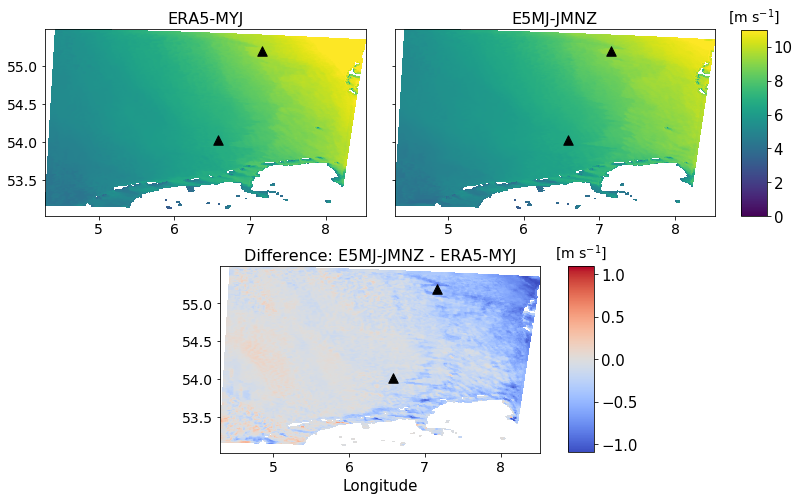

In [82]:
fig = plt.figure(figsize=(12,8))
for cc,case in enumerate(cases_of_interest):
    print(np.nanmax(mean_z0[case]))
    print(np.nanmin(mean_z0[case]))
    plt.subplot2grid((2,2), (0,cc),aspect='equal')
    z0_plt = plt.pcolormesh(lon,lat,mean_wspd[case],norm=Normalize(0,11))
    plt.title(case_dict[case]['d03']['name'],size=16)
    plt.tick_params(labelsize=14)
    plt.xlabel('')
    if cc != 0: plt.tick_params(labelleft=False)
    for ff,fino in enumerate([1,3]):
        plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                    wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                    marker='^',zorder=3,color='k',s=90)
        
z0_ax   = fig.add_axes([0.93, 0.545, 0.03, 0.324])
z0_cbar = fig.colorbar(z0_plt, cax=z0_ax)
z0_ax.text(5.5,11.5,'[m s$^{-1}$]',size=14,ha='center')
z0_ax.tick_params(labelsize=15)

plt.subplot2grid((2,4), (1,1),aspect='equal',colspan=2)

diff_plt = plt.pcolormesh(lon,lat,(mean_wspd[cases_of_interest[1]] - mean_wspd[cases_of_interest[0]]),
                            cmap=plt.cm.coolwarm,norm=Normalize(-1.10,1.10))

plt.xlabel('Longitude',size=15)
plt.tick_params(labelsize=14)
for ff,fino in enumerate([1,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('Difference: {} - {}'.format(case_dict[cases_of_interest[1]]['d03']['name'],
                                             case_dict[cases_of_interest[0]]['d03']['name']),size=16)
diff_ax   = fig.add_axes([0.73, 0.135, 0.03, 0.324])
diff_cbar = fig.colorbar(diff_plt, cax=diff_ax)
diff_ax.text(0.0,1.2,'[m s$^{-1}$]',size=14,ha='center')
diff_ax.tick_params(labelsize=15)

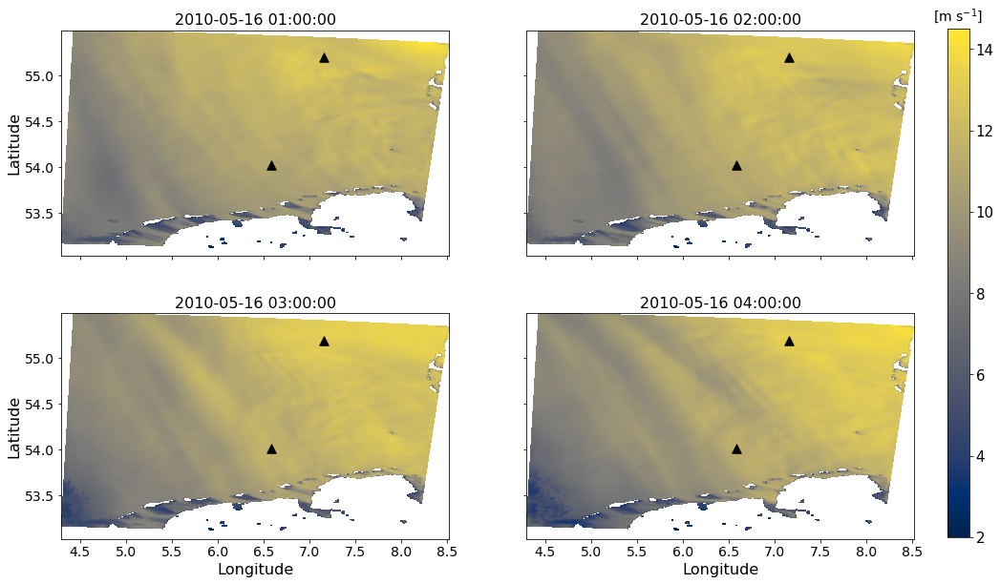

In [74]:
fig = plt.figure(figsize=(16,10))
f_start = 25
row,col = 0,0
for ff,wrfout_f in enumerate(wrfout_f_dict[case][f_start:f_start+4]):

    plt.subplot2grid((2,2), (row,col),aspect='equal')
    wrf_time = pd.to_datetime(case_wspd[case][ff+f_start].XTIME.data)
    
    wspd_plt = plt.pcolormesh(lon,lat,case_wspd[case][ff+f_start],norm=Normalize(2,14.5),cmap=plt.cm.cividis)
    plt.title(wrf_time,size=16)
    plt.tick_params(labelsize=14)
    plt.xlabel('')
    if col != 0: 
        plt.tick_params(labelleft=False)
    else:
        plt.ylabel('Latitude',size=16)
    if row != 1: 
        plt.tick_params(labelbottom=False)
    else:
        plt.xlabel('Longitude',size=16)
    for ff,fino in enumerate([1,3]):
        plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                    wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                    marker='^',zorder=3,color='k',s=90)
    col += 1
    if col > 1:
        col = 0
        row += 1

        
diff_ax   = fig.add_axes([0.93, 0.135, 0.02, 0.74])
diff_cbar = fig.colorbar(wspd_plt, cax=diff_ax)
diff_ax.text(8,14.7,'[m s$^{-1}$]',size=14,ha='center')
diff_ax.tick_params(labelsize=15)        
plt.show()

        

In [55]:
base_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST']
ghrs_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_GHR']
gskn_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_GHR_SSTSKIN']
jmnz_full = wrfout_f_dict['ERAI_YSU_KF_JMNZ_OST']
skin_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST_SSTSKIN']
updt_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST_SSTUPDATE']

time_of_interest = '2010-05-15_12:00:00'

for f in base_full:
    if time_of_interest in f:
        print(f)
        base_f = f
for f in ghrs_full:
    if time_of_interest in f:
        print(f)
        ghrs_f = f
for f in gskn_full:
    if time_of_interest in f:
        print(f)
        gskn_f = f
for f in jmnz_full:
    if time_of_interest in f:
        print(f)
        jmnz_f = f
for f in skin_full:
    if time_of_interest in f:
        print(f)
        skin_f = f
for f in updt_full:
    if time_of_interest in f:
        print(f)
        updt_f = f

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_GHR/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_GHR_SSTSKIN/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_JMNZ_OST/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST_SSTSKIN/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST_SSTUPDATE/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00


In [56]:
fino_markerc = ['coral','forestgreen','royalblue']

In [57]:
base_out = ncdf(base_f)
ghrs_out = ncdf(ghrs_f)
gskn_out = ncdf(gskn_f)
jmnz_out = ncdf(jmnz_f)
skin_out = ncdf(skin_f)
updt_out = ncdf(updt_f)

In [59]:
landmask = jmnz_out.variables['LANDMASK'][0,:,:]
lon = base_out.variables['XLONG'][0,:,:]
lat = base_out.variables['XLAT'][0,:,:]

border = landmask*0.0
border[0,:] = border[0,:]+1.0
border[-1,:] = border[-1,:]+1.0
border[:,0] = border[:,0]+1.0
border[:,-1] = border[:,-1]+1.0

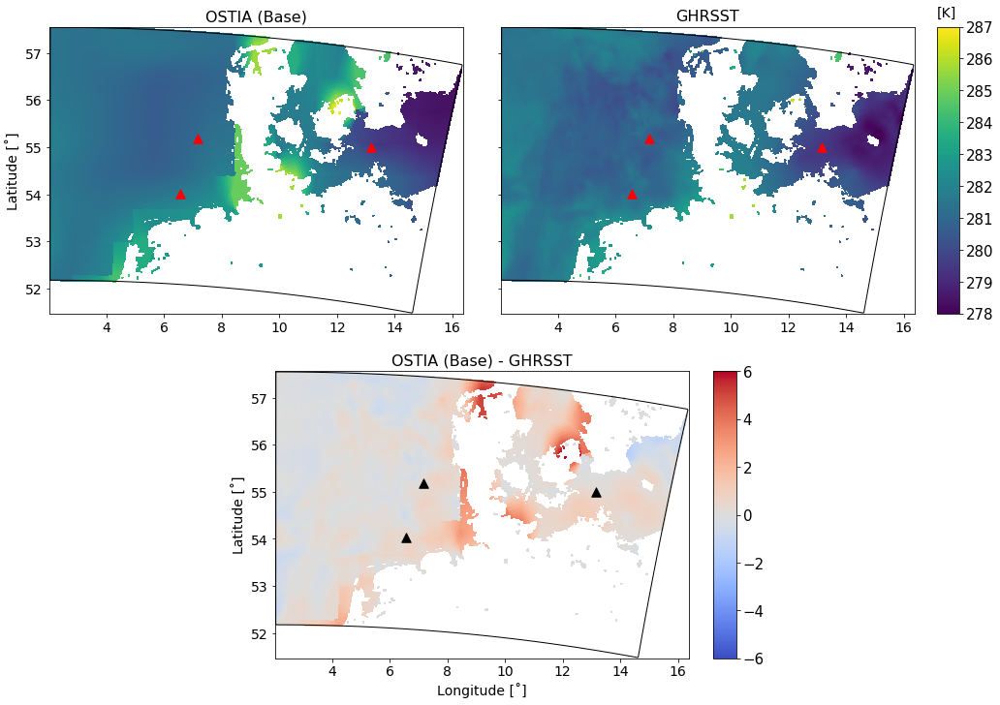

In [60]:
base_sst = base_out.variables['TSK'][0,:,:]
base_sst[landmask>0] = np.nan
ghrs_sst = ghrs_out.variables['TSK'][0,:,:]
ghrs_sst[landmask>0] = np.nan

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,base_sst,norm=Normalize(278,287))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('OSTIA (Base)',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,ghrs_sst,norm=Normalize(278,287))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,1),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-ghrs_sst,cmap=plt.cm.coolwarm,norm=Normalize(-6,6))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - GHRSST',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.72, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

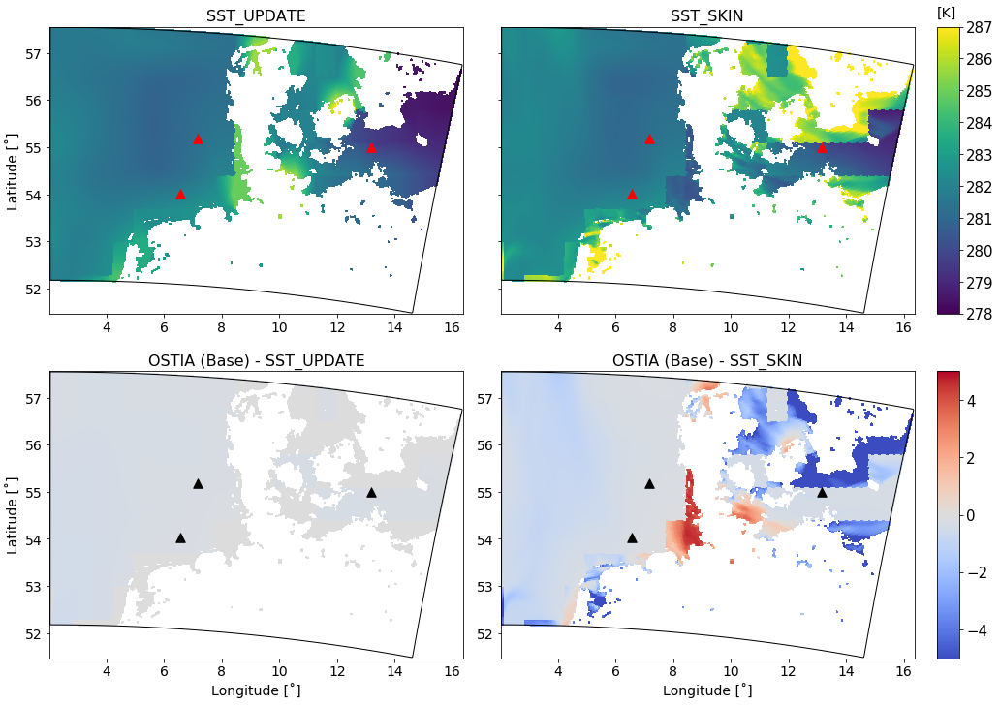

In [61]:
updt_sst = updt_out.variables['TSK'][0,:,:]
updt_sst[landmask>0] = np.nan
skin_sst = skin_out.variables['TSK'][0,:,:]
skin_sst[landmask>0] = np.nan
minT,maxT = 278,287
diffT = 5

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,updt_sst,norm=Normalize(minT,maxT))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,skin_sst,norm=Normalize(minT,maxT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('SST_SKIN',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,0),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-updt_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


plt.subplot2grid((2,4),(1,2),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-skin_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - SST_SKIN',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
#plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.92, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

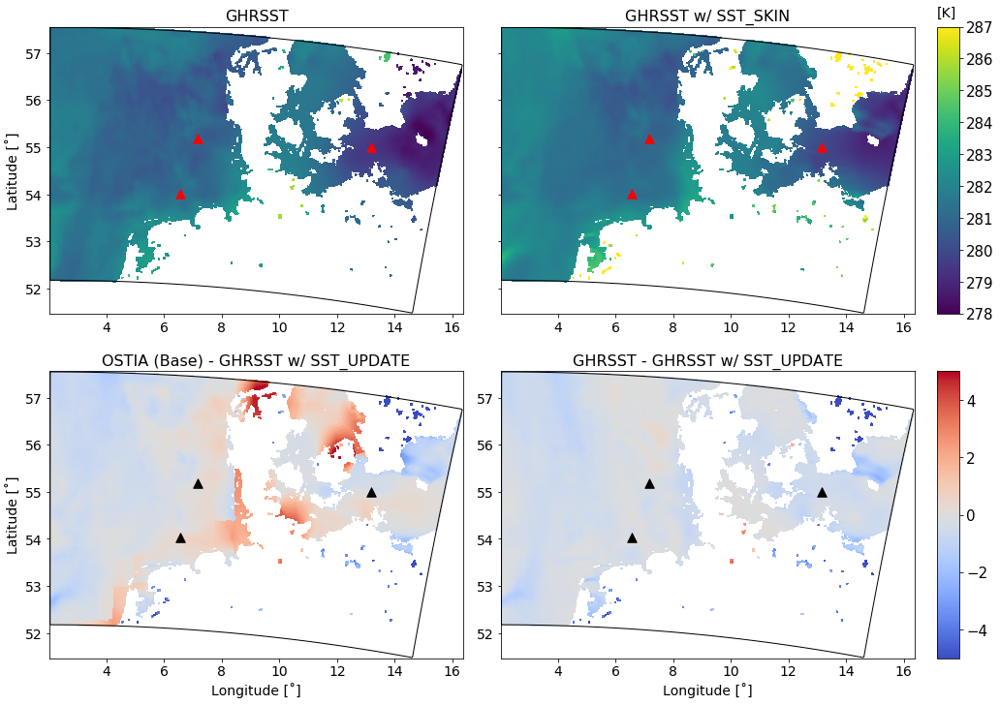

In [64]:
ghrs_sst = ghrs_out.variables['TSK'][0,:,:]
ghrs_sst[landmask>0] = np.nan
gskn_sst = gskn_out.variables['TSK'][0,:,:]
gskn_sst[landmask>0] = np.nan
minT,maxT = 278,287
diffT = 5

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,ghrs_sst,norm=Normalize(minT,maxT))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,gskn_sst,norm=Normalize(minT,maxT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST w/ SST_SKIN',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,0),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-gskn_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - GHRSST w/ SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


plt.subplot2grid((2,4),(1,2),colspan=2)
diffplt = plt.pcolormesh(lon,lat,ghrs_sst-gskn_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('GHRSST - GHRSST w/ SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
#plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.92, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

In [77]:
print(np.nanmin(base_znt),np.nanmax(base_znt))
print(np.nanmin(jmnz_znt),np.nanmax(jmnz_znt))

3.2603046e-05 0.00094593083
2.6688427e-05 0.00285


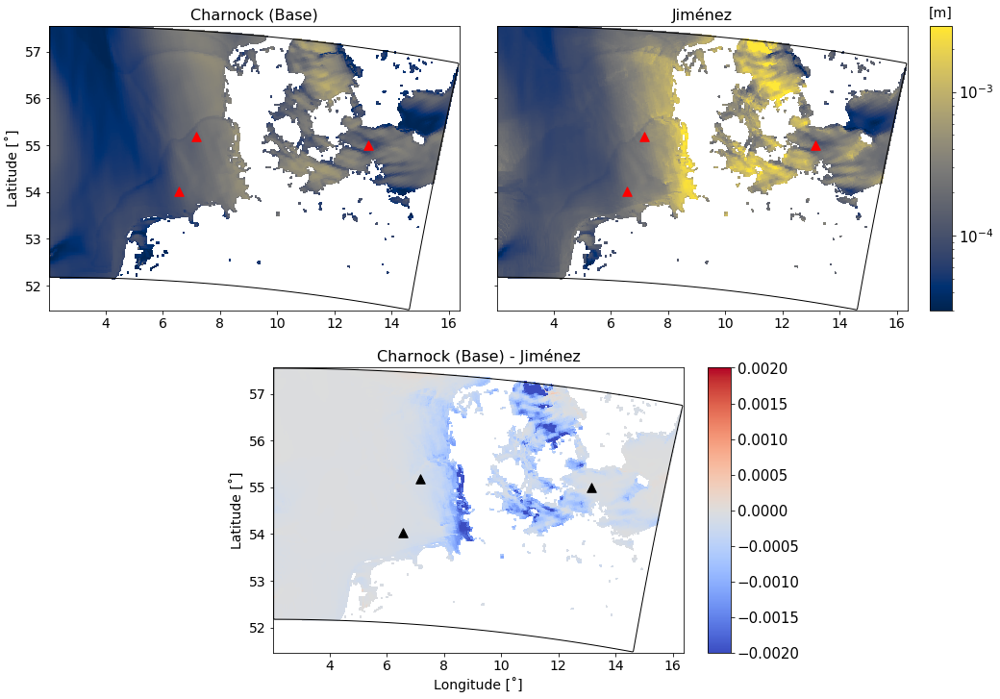

In [42]:
base_znt = base_out.variables['ZNT'][0,:,:]
base_znt[landmask>0] = np.nan
jmnz_znt = jmnz_out.variables['ZNT'][0,:,:]
jmnz_znt[landmask>0] = np.nan

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,base_znt,norm=colors.LogNorm(3e-5,2.9e-3),cmap=plt.cm.cividis)
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('Charnock (Base)',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
jmnzplt = plt.pcolormesh(lon,lat,jmnz_znt,norm=colors.LogNorm(3e-5,2.9e-3),cmap=plt.cm.cividis)
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('Jiménez',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,1),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_znt-jmnz_znt,cmap=plt.cm.coolwarm,norm=Normalize(-2e-3,2e-3))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('Charnock (Base) - Jiménez',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)

sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(2.5e-5,3.3e-3,'[m]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.72, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

# Check flow fields

In [ ]:
poi_dict

In [29]:
for poi in poi_dict:
    if poi == 1:
        toi = ['2010-05-15 18:00:00',
               '2010-05-15 21:00:00',
               '2010-05-16 00:00:00',
               '2010-05-16 03:00:00']
        case_list = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM']*4
        rst = 'FINO_2010051412'
    if poi == 2:
        toi = ['2010-05-19 08:00:00',
               '2010-05-19 10:00:00',
               '2010-05-19 16:00:00',
               '2010-05-19 18:00:00']
        case_list = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM',
                'ERA5_YSU_CHRN_ER5_NOSK_3DOM',
                'GFSR_MYJ_CHRN_GFS_NOSK_3DOM',
                'GFSR_MYJ_CHRN_GFS_NOSK_3DOM']
        rst = 'FINO_2010051812'
    if poi == 3:
        toi = ['2010-05-25 09:00:00',
               '2010-05-25 11:00:00',
               '2010-05-25 13:00:00',
               '2010-05-25 15:00:00']
        case_list = ['ERA5_YSU_CHRN_ER5_NOSK_3DOM']*4
        rst = 'FINO_2010052412'

        
    poi_dict[poi]['toi'] = toi
    poi_dict[poi]['case'] = case_list
    poi_dict[poi]['restart'] = rst


In [17]:
sorted(glob.glob('{}{}/{}/wrfout_d03*'.format(wrf_dir,cases[0],restarts[1])))

['/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_12:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_13:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_14:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_15:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_16:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_17:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERA5_MYJ_CHRN_ER5_NOSK_3DOM/FINO_2010051412/wrfout_d03_2010-05-14_18:00:00',
 '/glade/scratch/hawbecke/WRF/MMC/

In [ ]:
plt.quiver()

3.3876872 15.529151
2.2707667 16.55035
2.1947832 19.075457
2.2837348 17.89405


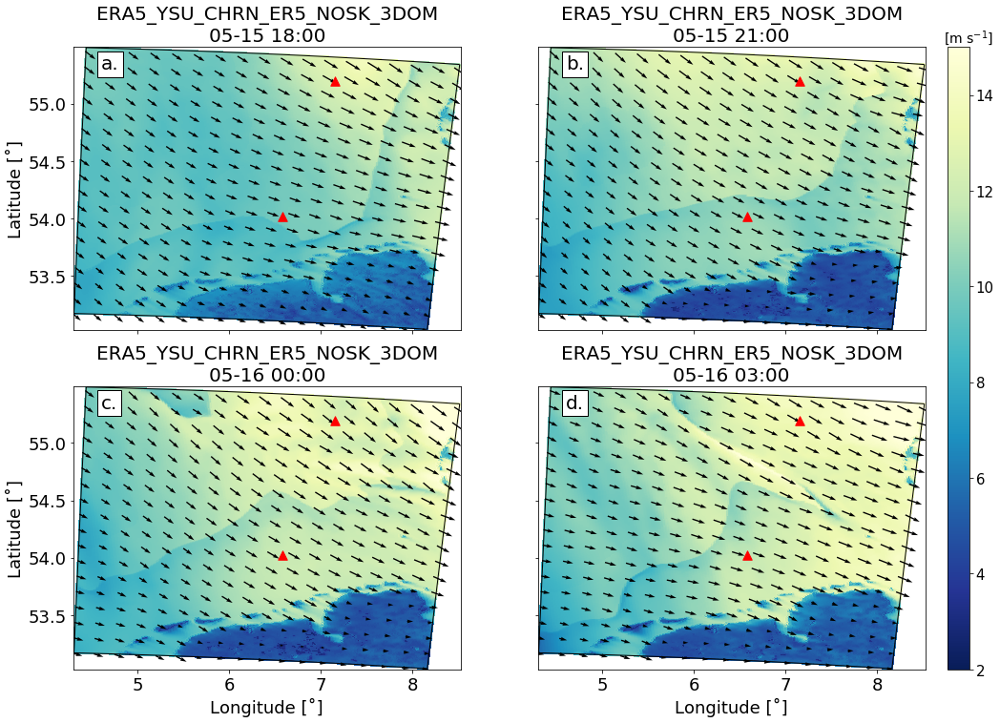

4.7455745 14.426398
4.248232 14.052833
3.4694898 13.697203
3.2351673 13.750215


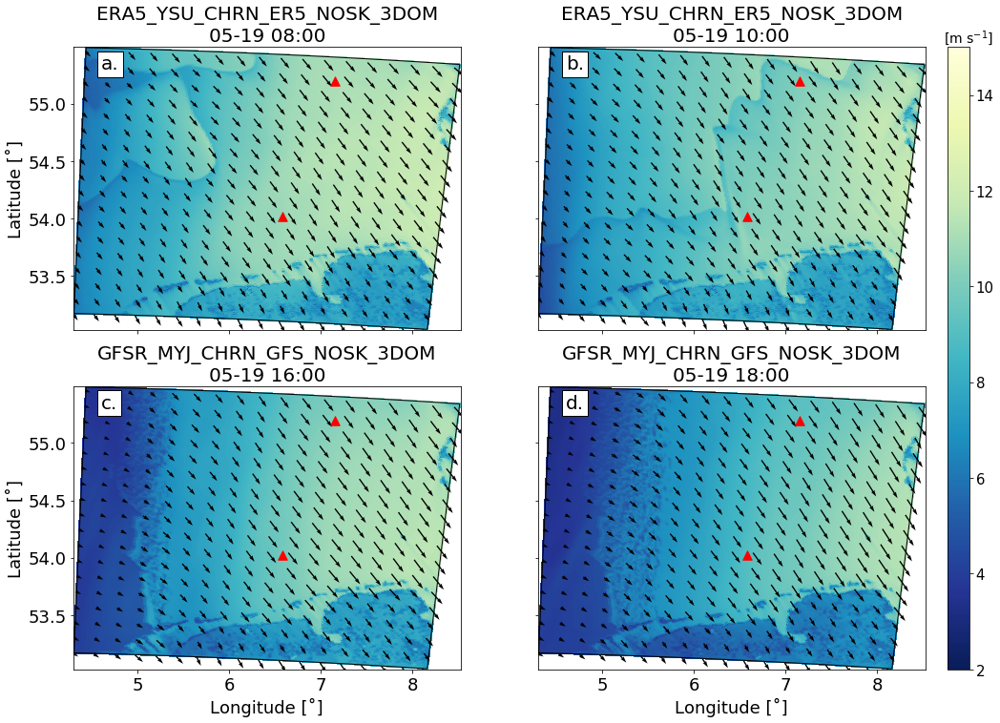

3.3112812 14.939909
3.6174161 14.960118
3.5836082 13.821098
3.3704305 12.662855


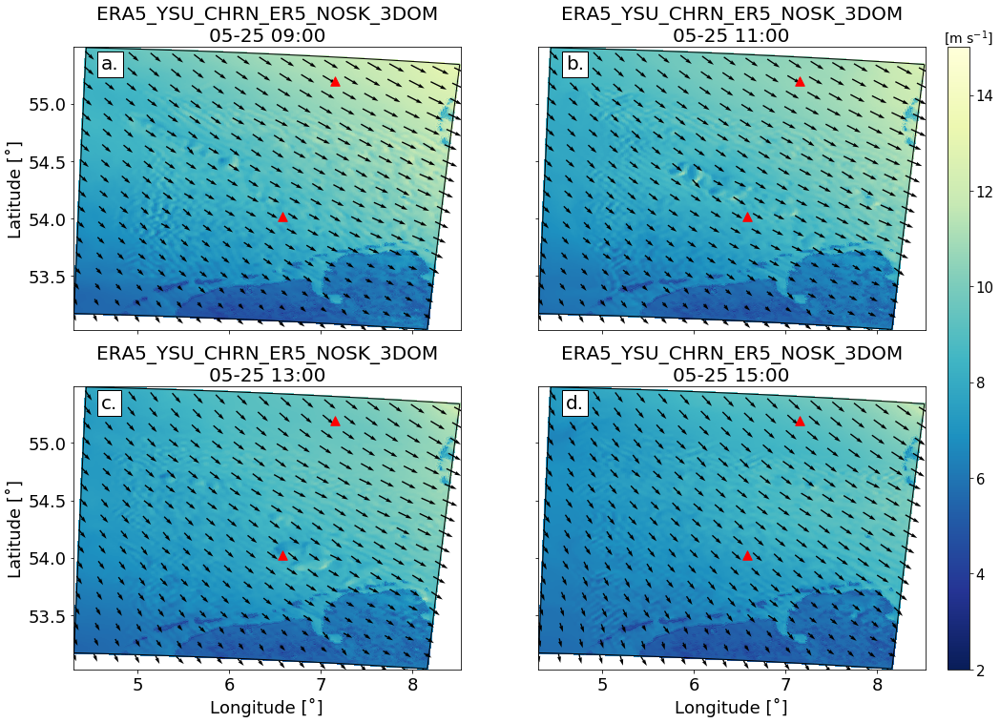

In [99]:
init_vars = True
for poi in poi_dict:
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(16,12),sharex=True,sharey=True)
    row,col = 0,0
    label_str = ['a.','b.','c.','d.']
    for tt,toi in enumerate(poi_dict[poi]['toi']):
        toi = pd.to_datetime(toi)
        case = poi_dict[poi]['case'][tt]
        restart = poi_dict[poi]['restart']
        wrf_f = '{0}{1}/{2}/wrfout_d03_{3:04d}-{4:02d}-{5:02d}_{6:02d}:00:00'.format(wrf_dir,case,restart,
                                                                                    toi.year,toi.month,
                                                                                    toi.day,toi.hour)
        wrfout = ncdf(wrf_f)
        if init_vars:
            lat = wrfout.variables['XLAT'][0,:,:]
            lon = wrfout.variables['XLONG'][0,:,:]
            wrf_i = '{0}{1}/{2}/wrfinput_d03'.format(wrf_dir,case,restart)
            wrfin = ncdf(wrf_i)
            landmask = wrfin.variables['LANDMASK'][0,:,:]

            border = landmask*0.0
            border[0,:] = border[0,:]+1.0
            border[-1,:] = border[-1,:]+1.0
            border[:,0] = border[:,0]+1.0
            border[:,-1] = border[:,-1]+1.0       
            init_vars = False
            
            
            
            
        u10 = wrfout.variables['U10'][0,:,:]
        v10 = wrfout.variables['V10'][0,:,:]

#        u10 = wrfout.variables['U'][0,10,:,:]
#        v10 = wrfout.variables['V'][0,10,:,:]
#        u10 = 0.5*(u10[:,1:] + u10[:,:-1])
#        v10 = 0.5*(v10[1:,:] + v10[:-1,:])
        vel10 = np.sqrt(u10**2 + v10**2)

        baseplt = ax[row,col].pcolormesh(lon,lat,vel10,norm=Normalize(2,15),cmap=plt.cm.YlGnBu_r)
        #plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
        ax[row,col].contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
        qint = 15
        ax[row,col].quiver(lon[::qint,::qint],lat[::qint,::qint],u10[::qint,::qint],v10[::qint,::qint])
        for ff,fino in enumerate([1,3]):
            ax[row,col].scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                        wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                        marker='^',zorder=3,color='r',s=90)
        print(np.nanmin(vel10),np.nanmax(vel10))
        ax[row,col].set_title('{3}\n{0:02d}-{1:02d} {2:02d}:00'.format(toi.month,toi.day,toi.hour,case),size=20)
        ax[row,col].tick_params(labelsize=18)
        
        props = dict(facecolor='w', alpha=1.0)
        ax[row,col].text(4.6,55.3,label_str[tt],size=20,bbox=props)

        
        
        if row == 1: ax[row,col].set_xlabel('Longitude [˚]',size=18)
        if col == 0: ax[row,col].set_ylabel('Latitude [˚]',size=18)
        col += 1
        if col == 2:
            col = 0
            row += 1
    cbar_ax = fig.add_axes([0.92, 0.125, 0.02, 0.755])
    cbar = fig.colorbar(baseplt, cax=cbar_ax)
    cbar_ax.text(0.0,15.1,'[m s$^{-1}$]',size=14)
    cbar_ax.tick_params(labelsize=15)
    plt.show()
    
    

40.0


NameError: name 'wake_degs' is not defined

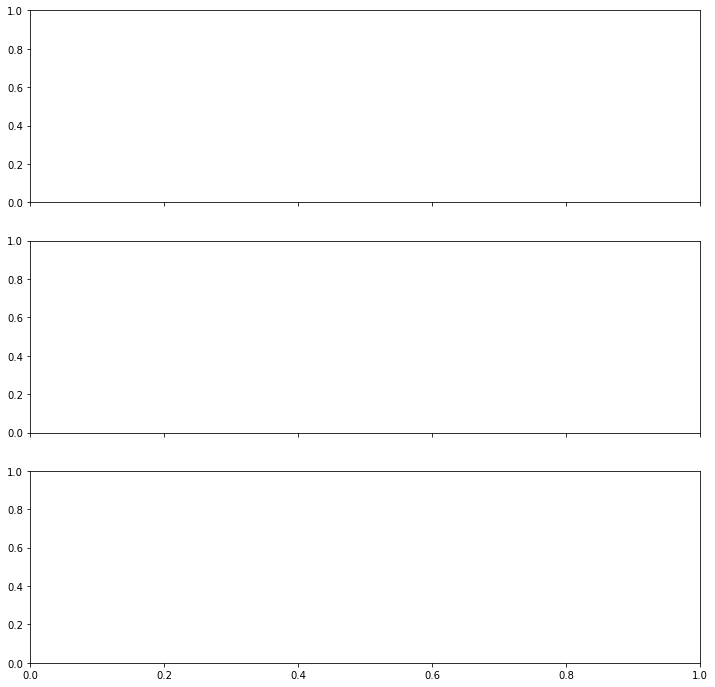

In [13]:
for cc,case in enumerate(cases_of_interest):
    case_dir = '{}{}/'.format(wrf_dir,case)
    for ff, fino in enumerate([1,3]):
        fig,ax = plt.subplots(nrows=3,figsize=(12,12),sharex=True)

        obs_ds = fino_obs['FINO{}'.format(fino)]
        period = obs_ds.sel(datetime=slice(case_days_start[0],case_days_end[0]))
        #period = obs_ds.sel(datetime=slice('2010-05-16','2010-05-18'))
        
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)]
        height = twr_ds.height.data
        if len(np.shape(height)) > 1:
            levels = height[-1,:,0]
        else:
            levels = height


        # ============================================= #
        # ============= WIND SPEED PLOT =============== #
        plt_levels = period.spd_levels.values
        plt_levels = [40.,60.,80.,100.]
        n_plt_lvls = len(plt_levels)

        plt_colors=plt.cm.rainbow(np.linspace(0,1,n_plt_lvls))

        for vv,lvl in enumerate(plt_levels):
            wlvl = np.where(levels==lvl)[0][0]
            wspd_plt = period.wspd.sel(spd_levels=lvl).dropna(how='all',dim='datetime')
            
            
            if fino == 1:

                print(lvl)
                if lvl in period.anm_levels:
                    anem_spd = period.anm_spd.sel(anm_levels=lvl).dropna(how='all',dim='datetime')
                    wspd = period.wspd.sel(spd_levels=lvl).dropna(how='all',dim='datetime')
                    wdir = period.wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
                    if len(anem_spd) > 1:
                        good_to_replace = True
                        anem_spd = anem_spd.resample(datetime='10min').interpolate('linear')
                    else:
                        good_to_replace = False

                    if good_to_replace:
                        inds_of_interest = np.where((wdir.data >= wake_degs['FINO{}'.format(1)][0]) & \
                                          (wdir.data <= wake_degs['FINO{}'.format(1)][1]))
                        wspd_plt[inds_of_interest] = anem_spd.data[inds_of_interest]
                    else:
                        print('Unable to replace height {} for FINO-{} due to missing data'.format(lvl,fino))

            
            
            if len(wspd_plt) > 1:
                wspd_plt.plot(ax=ax[0],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl))

            wspd_plt = twr_ds.wspd.sel(nz=wlvl)
            if len(wspd_plt) > 1:
                wspd_plt.plot(ax=ax[0],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        # ============================================= #
        # ============= WIND DIREC PLOT =============== #
        plt_levels = period.dir_levels.values
        n_plt_lvls = len(plt_levels)

        plt_colors=plt.cm.rainbow(np.linspace(0,1,n_plt_lvls))

        for vv,lvl in enumerate(plt_levels):
            clvl = np.where(plt_levels==lvl)[0][0]
            wlvl = np.where(levels==lvl)[0][0]
            wdir_plt = period.wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
            if len(wdir_plt) > 1:
                wdir_plt.plot(ax=ax[1],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl))

            wdir_plt = twr_ds.wdir.sel(nz=wlvl)
            if len(wdir_plt) > 1:
                wdir_plt.plot(ax=ax[1],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        # ============================================= #
        # ============= TEMPERATURE PLOT ============== #
        plt_levels = period.tmp_levels.values
        n_plt_lvls = len(plt_levels)


        plt_colors=plt.cm.Spectral_r(np.linspace(0,1,n_plt_lvls))            
        for vv,lvl in enumerate(plt_levels): 
            wlvl = np.where(levels==lvl)[0][0]
            tmp_plt = period.temp.sel(tmp_levels=lvl).dropna(how='all',dim='datetime')
            if len(tmp_plt) > 1:
                tmp_plt.plot(ax=ax[2],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl)

            tmp_plt = twr_ds.theta.sel(nz=wlvl)-273.15
            if len(tmp_plt) > 1:
                tmp_plt.plot(ax=ax[2],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        sst_data = True
        try:
            sst_plt = period.sst.dropna(dim='datetime',how='any')
        except:
            sst_data = False
        if sst_data:
            if len(sst_plt.values[0]) > 1:
                sst_plt.plot(ax=ax[2],c='k',label='SST',lw=2.0,ls=':')

        (twr_ds.tsk-273.15).plot(c='k',alpha=0.85,label='WRF_SKT')




        # --------- Wind Speed Adjustments ---------- #
        plt_start_date = pd.to_datetime(period.datetime.values[0])
        plt_end_date = pd.to_datetime(period.datetime.values[-1])
        if fino == 3:
            ax[0].set_title('FINO{} {}/{} to {}/{} in {} - Boom: {}'.format(fino,plt_start_date.month,
                                                plt_start_date.day,plt_end_date.month,plt_end_date.day,
                                                plt_end_date.year,boom_deg),size=22,y=1.14)
        else:
            ax[0].set_title('FINO{} {}/{} to {}/{} in {}'.format(fino,plt_start_date.month,plt_start_date.day,
                                                plt_end_date.month,plt_end_date.day,plt_end_date.year),
                                                size=22,y=1.14)
        ax[0].set_xlabel('')
        ax[0].tick_params(labelsize=14)
        ax[0].set_ylabel('Wind speed [m/s]',size=15)
        ax[0].set_ylim(0,20)
        ax[0].set_xlim(period.datetime.values[0],period.datetime.values[-1])
        leg_loc = 0.89
        ax[0].legend(frameon=False,loc=(0.01,leg_loc),ncol=5,fontsize=12)

        # --------- Wind Direction Adjustments --------- #
        ax[1].legend(frameon=False,loc=(-0.01,0.99),ncol=7,fontsize=12)
        #ax[1].set_ylim(230,310)
        ax[1].set_ylim(0,360)
        ax[1].set_xlabel('')
        ax[1].set_xlim(period.datetime.values[0],period.datetime.values[-1])
        ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],290,350,color='darkgreen',alpha=0.1)
        ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],250,290,color='gold',alpha=0.1)
        ax[1].set_title('')
        ax[1].tick_params(labelsize=14)
        ax[1].set_ylabel('Wind direction [˚]',size=15)
        if fino == 2: 
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               wake_degs['FINO{}'.format(fino)][0],360,color='red',alpha=0.3)
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               0.0,wake_degs['FINO{}'.format(fino)][1],color='red',alpha=0.3)
        else:
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               wake_degs['FINO{}'.format(fino)][0],wake_degs['FINO{}'.format(fino)][1],
                               color='red',alpha=0.2)

        # --------- Temperature Adjustments --------- #
        #ax[2].set_ylim(0,360)
        #ax[2].set_xlim(twr_ds.datetime.values[0],twr_ds.datetime.values[-1])
        ax[2].set_xlim(xlim_s,xlim_e)
        ax[2].set_title('')
        ax[2].tick_params(labelsize=14)
        ax[2].set_ylabel('Temperature',size=15)
        ax[2].set_xlabel('Datetime',size=15)
        ax[2].legend(frameon=False,loc=(-0.01,0.99),ncol=7,fontsize=12)
        # -------------------------------------------- #

        # Save the figures:
        if fino==3:
            savestr = '{}img/case_day_{}_FINO{}_boomdeg{}.png'.format(case_dir,case_days_start[0],fino,boom_deg)
        else:
            savestr = '{}img/case_day_{}_FINO{}.png'.format(case_dir,case_days_start[0],fino)
        if save_figs: plt.savefig(savestr)

        plt.show()
        print('\n\n\n\n')
        

# Wind Speed Taylor Diagrams

In [19]:
t_s = wrf_twrs[cases[0]]['FN1'].datetime.data[0] + pd.to_timedelta(12,'h') # Account for spinup
t_e = wrf_twrs[cases[0]]['FN1'].datetime.data[-1]

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO1_nowake


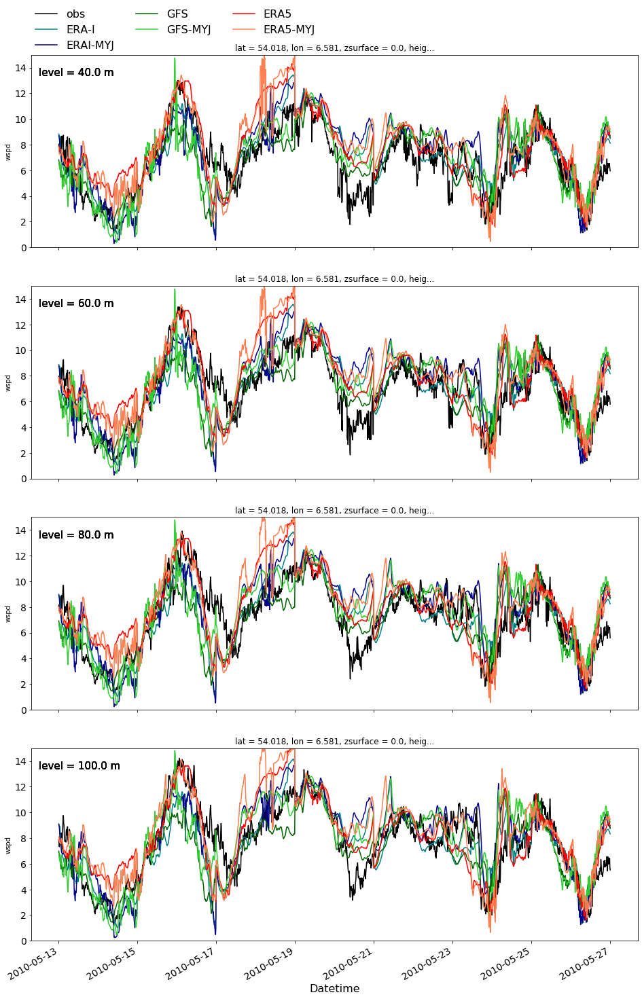

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO1_nowake


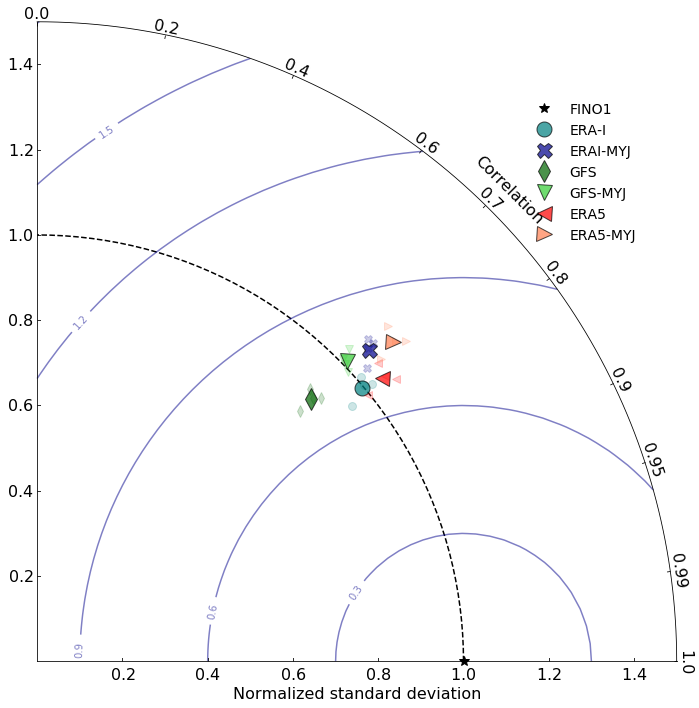

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO3_nowake


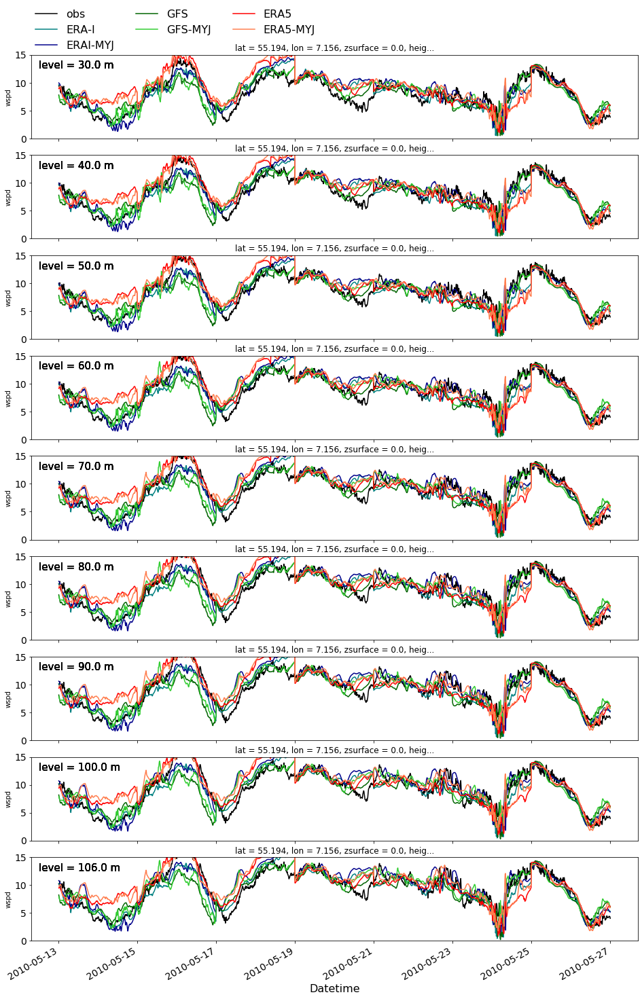

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO3_nowake


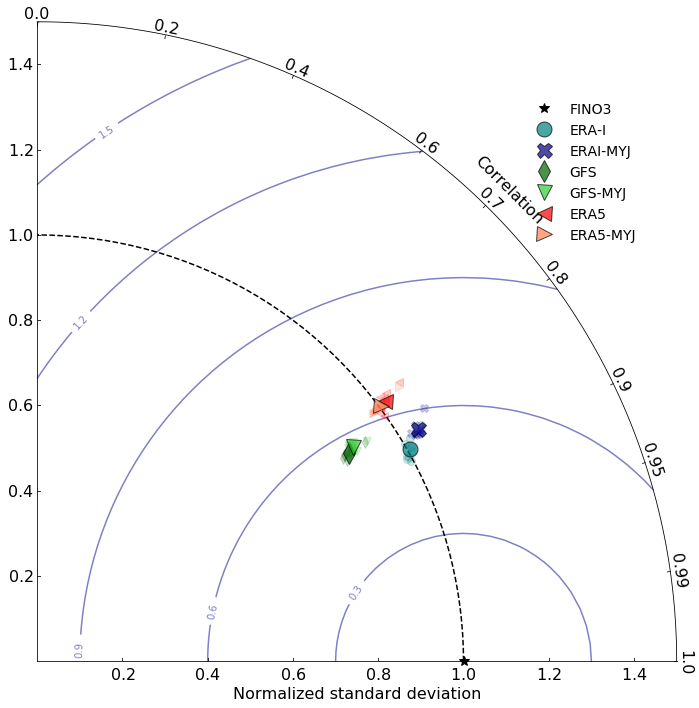

In [20]:
remove_mean  = False
remove_wake  = True
replace_wake = True
for ff, fino in enumerate([1,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.spd_levels.values
    if fino == 1: levels = [40.0,60.0,80.0,100.0]
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    
    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels)))
    sim_std_levels = np.zeros((ncases,len(levels)))
    sim_cor_levels = np.zeros((ncases,len(levels)))
    fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)
    for cc,case in enumerate(cases_of_interest):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]

        for vv,lvl in enumerate(levels):
            if cc == 0:

                
                
                remove = (remove_wake and lvl < 100.0)
                replace = (replace_wake and (fino == 1 or fino == 2))

                tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=t_s,end=t_e,remove_wake=remove,
                                                            replace_wake=(replace and (fino == 1 or fino == 2)),
                                                            wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                            wake_deg_top=wake_degs['FINO{}'.format(fino)][1])
                
            
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #            
            ### THIS SHOULD NOT BE A MEAN!!        
            tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(t_s,t_e),nz=vv).dropna(
                                                how='all',dim='datetime').resample(datetime='10min').mean()
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #

            ax[vv].text(twr_ds.datetime.values[0],14.0,'level = {} m'.format(lvl),va='top',size=15)
            
            if remove_wake:
                wake_spd = tay_wrf_levels[vv].copy()
                wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                tay_wrf_levels[vv] = wake_spd

            obs = tay_obs_levels[vv]
            sim = tay_wrf_levels[vv]

            sim[np.where(np.isnan(obs))] = np.nan

            obs = obs.dropna(dim='datetime',how='all')
            sim = sim.dropna(dim='datetime',how='all')
            if remove_mean:
                obs = obs - lowess_mean(obs,2016/32,0)
                sim = sim - lowess_mean(sim,2016/32,0)
                
            
            if len(obs) != len(sim):
                sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
            if cc == 0: 
                obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs')
            sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],
                                                         c=case_dict[case]['d03']['color'],
                                                         label=case_dict[case]['d03']['name'])
            ax[vv].tick_params(labelsize=14)
            if vv == len(levels)-1:
                ax[vv].set_xlabel('Datetime',size=16)
            else:
                ax[vv].set_xlabel('')
            if remove_mean: ax[vv].set_ylim(-5,5)


            ref_std_levels[cc,vv] = np.std(obs.data)
            sim_std_levels[cc,vv] = np.std(sim.data)
            sim_cor_levels[cc,vv],_ = pearsonr(sim, obs)
            ax[vv].set_ylim(0,15)
            
    ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
    save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    


    fig_tay = plt.figure(figsize=(12,12))    
    #dia = TaylorDiagram(1.0, fig=fig_tay, extend=False,
    #                        label='FINO{}'.format(fino))
    
        
    dia = TaylorDiagram(1.0, fig=fig_tay, 
                        extend=False,
                        label='FINO{}'.format(fino),
                        normalize=True,
                        srange=[0.0,1.50],
                        stdevticks=np.arange(0.2,5.6,0.2),
                        labelsize=16)
    
    td_stats = {}
    
    for cc,case in enumerate(cases_of_interest):
        td_stats[case] = pd.DataFrame(index=levels, columns=['std_norm','R2'], dtype=float) 

        markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

        for vv,lvl in enumerate(levels):
            td_stats[case].loc[lvl,'std_norm'] = sim_std_levels[cc,vv]/ref_std_levels[cc,vv]
            td_stats[case].loc[lvl,'R2'] = sim_cor_levels[cc,vv]

            dia.set_ref(ref_std_levels[cc,vv])
            if cc == 0:
                label_str = '{}'.format(lvl)
            else:
                label_str = None
            dia.add_sample(sim_std_levels[cc,vv], sim_cor_levels[cc,vv],
                           marker=case_dict[case]['d03']['marker'], ms=8, ls='',
                           mfc=case_dict[case]['d03']['color'], 
                           mec=case_dict[case]['d03']['color'], # Colors
                           #label=case_dict[case]['d03']['name'],
                           zorder=cc,alpha=0.2)

        #plt.text(0.01,0.01+0.04*cc,case,color=case_colors[case],ha='left',va='bottom',size=16)
        td_stats[case]['angle'] = np.arccos(td_stats[case]['R2'])
        td_mean = td_stats[case].mean(axis=0)
        dia.add_sample(td_mean['std_norm'], np.cos(td_mean['angle']),
               norm=False, # don't normalize this point
               marker=case_dict[case]['d03']['marker'], ms=15, ls='',
               mfc=case_dict[case]['d03']['color'], mec='k', # Colors
               label=case_dict[case]['d03']['name'],
               zorder=cc+3,alpha=0.7)
    contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
    dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    fig_tay.legend(frameon=False,loc=(0.75,0.65),fontsize=14)
    save_str = '{}/img/TD_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    
    

# Temperature TDs

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO1_T


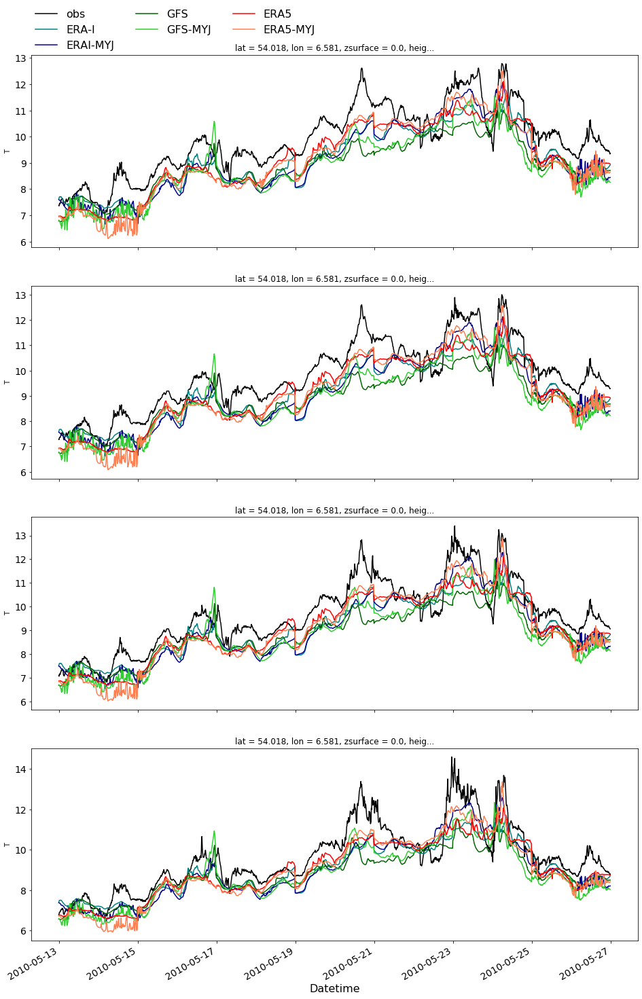

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO1_T


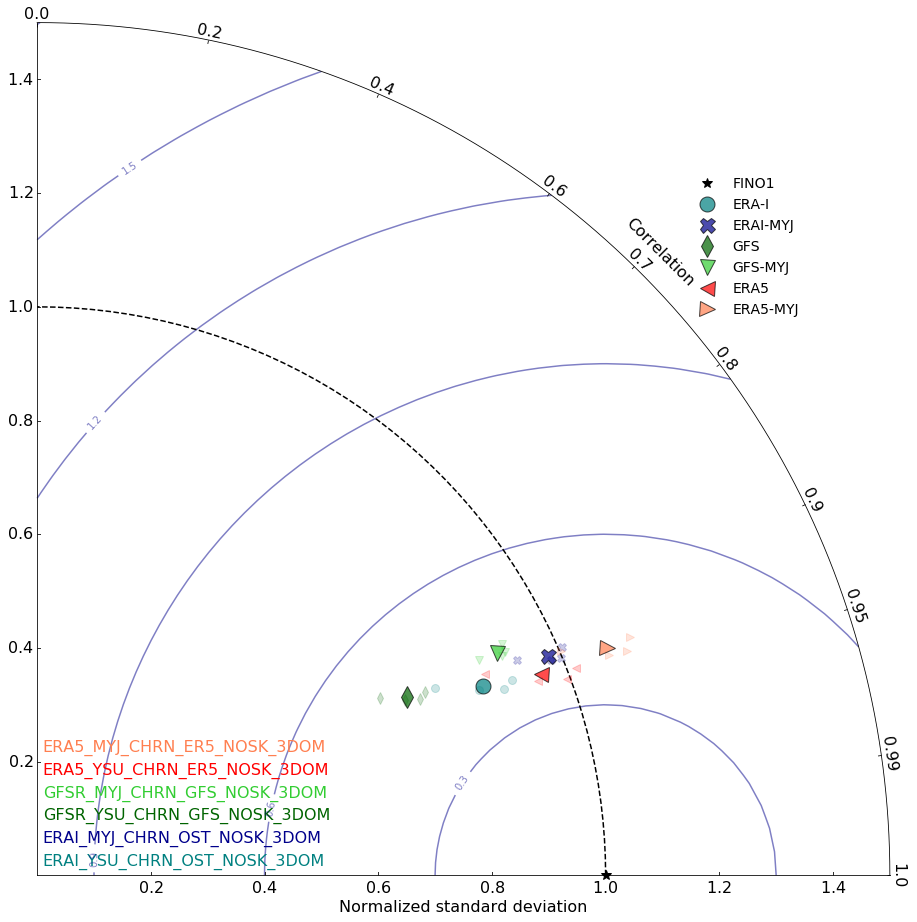

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO3_T


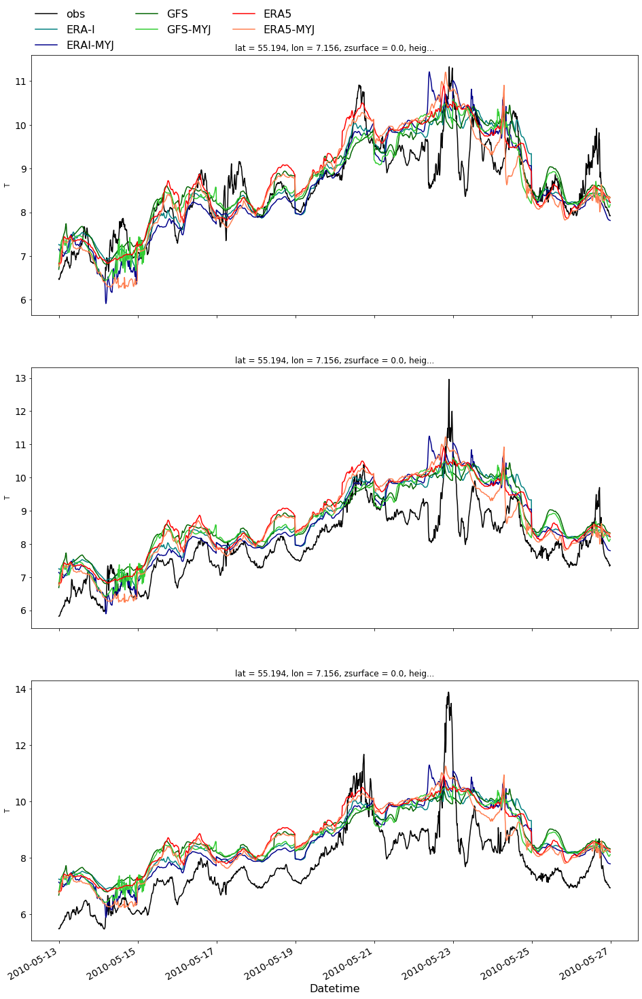

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO3_T


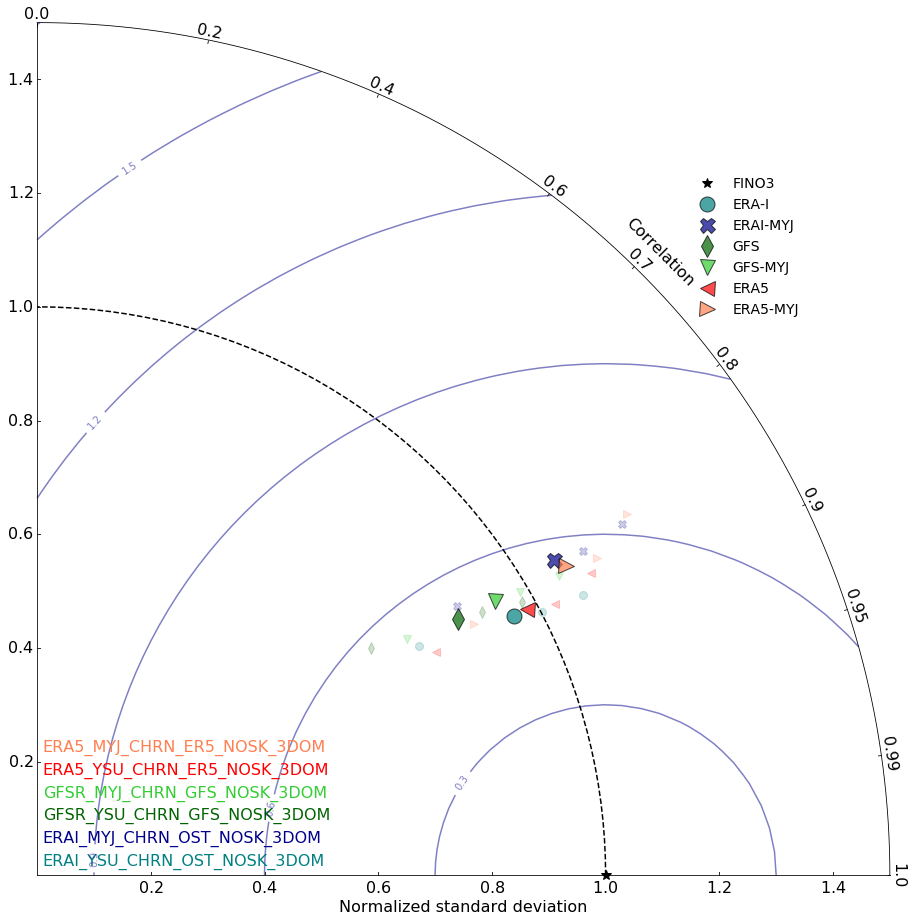

In [21]:
remove_wake = False

for ff, fino in enumerate([1,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)].copy()
    levels = obs_ds.tmp_levels.values
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    good_lvls = []
    for vv,lvl in enumerate(levels):
        if len(obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                               tmp_levels=lvl).dropna(how='all',dim='datetime')) > 1:
            good_lvls.append(lvl)
    levels = good_lvls

    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels)))
    sim_std_levels = np.zeros((ncases,len(levels)))
    sim_cor_levels = np.zeros((ncases,len(levels)))
    fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)

    for cc,case in enumerate(cases_of_interest):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]
        twr_ds['T'] = theta_to_T(twr_ds.theta,twr_ds.pr/100.0) - 273.15
        for vv,lvl in enumerate(levels):
            if cc == 0:
                tay_obs_levels[vv] = obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                                     tmp_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                     datetime='10min').interpolate('linear')

                if remove_wake:
                    obs_wdir = obs_ds.wdir.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                               dir_levels=dir_lvl).dropna(how='all',dim='datetime').resample(
                                               datetime='10min').nearest()
                    wake_tmp = tay_obs_levels[vv].copy()
                    if fino == 2:
                        wake_tmp[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    else:
                        wake_tmp[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    tay_obs_levels[vv] = wake_tmp

            tay_wrf_levels[vv] = twr_ds.T.sel(datetime=slice(case_days_start[0],case_days_end[0]),nz=vv).dropna(
                                                how='all',dim='datetime').resample(datetime='10min').mean()
            if remove_wake:
                wake_tmp = tay_wrf_levels[vv].copy()
                wake_tmp[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                tay_wrf_levels[vv] = wake_tmp

            obs = tay_obs_levels[vv]
            sim = tay_wrf_levels[vv]

            sim[np.where(np.isnan(obs))] = np.nan

            obs = obs.dropna(dim='datetime',how='all')
            sim = sim.dropna(dim='datetime',how='all')

            if remove_mean:
                obs = obs - lowess_mean(obs,2016/32,0)
                sim = sim - lowess_mean(sim,2016/32,0)

            if cc == 0: 
                obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs')
            sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],
                                                         c=case_dict[case]['d03']['color'],
                                                         label=case_dict[case]['d03']['name'])
            ax[vv].tick_params(labelsize=14)
            if vv == len(levels)-1:
                ax[vv].set_xlabel('Datetime',size=16)
            else:
                ax[vv].set_xlabel('')
            if remove_mean: ax[vv].set_ylim(-5,5)
            if len(obs) != len(sim):
                sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
            ref_std_levels[cc,vv] = np.std(obs.data)
            sim_std_levels[cc,vv] = np.std(sim.data)
            sim_cor_levels[cc,vv],_ = pearsonr(sim, obs)
    ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
    save_str = '{}/img/TD_data_FINO{}_T'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    


    fig_tay = plt.figure(figsize=(16,16))    
    dia = TaylorDiagram(1.0, fig=fig_tay, 
                        extend=False,
                        label='FINO{}'.format(fino),
                        normalize=True,
                        srange=[0.0,1.50],
                        stdevticks=np.arange(0.2,5.6,0.2),
                        labelsize=16)
    
    td_stats = {}
    for cc,case in enumerate(cases_of_interest):
        td_stats[case] = pd.DataFrame(index=levels, columns=['std_norm','R2'], dtype=float) 

        markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

        for vv,lvl in enumerate(levels):
            td_stats[case].loc[lvl,'std_norm'] = sim_std_levels[cc,vv]/ref_std_levels[cc,vv]
            td_stats[case].loc[lvl,'R2'] = sim_cor_levels[cc,vv]

            dia.set_ref(ref_std_levels[cc,vv])
            if cc == 0:
                label_str = '{}'.format(lvl)
            else:
                label_str = None
            dia.add_sample(sim_std_levels[cc,vv], sim_cor_levels[cc,vv],
                           marker=case_dict[case]['d03']['marker'], ms=8, ls='',
                           mfc=case_dict[case]['d03']['color'], 
                           mec=case_dict[case]['d03']['color'], # Colors
                           #label=case_dict[case]['d03']['name'],
                           zorder=cc,alpha=0.2)
        plt.text(0.01,0.01+0.04*cc,case,color=case_dict[case]['d03']['color'],ha='left',va='bottom',size=16)
        td_stats[case]['angle'] = np.arccos(td_stats[case]['R2'])
        td_mean = td_stats[case].mean(axis=0)
        dia.add_sample(td_mean['std_norm'], np.cos(td_mean['angle']),
               norm=False, # don't normalize this point
               marker=case_dict[case]['d03']['marker'], ms=15, ls='',
               mfc=case_dict[case]['d03']['color'], mec='k', # Colors
               label=case_dict[case]['d03']['name'],
               zorder=cc+3,alpha=0.7)
    contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
    dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    fig_tay.legend(frameon=False,loc=(0.75,0.65),fontsize=14)
    save_str = '{}/img/TD_FINO{}_T'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    

# Observation correlation:

In [81]:
fn1_obs = fino_obs['FINO1'].wspd.sel(spd_levels=33.0).resample(datetime='10min').nearest()
fn2_obs = fino_obs['FINO2'].wspd.sel(spd_levels=32.0).resample(datetime='10min').nearest()
fn3_obs = fino_obs['FINO3'].wspd.sel(spd_levels=30.0).resample(datetime='10min').nearest()

fn1_obs = fn1_obs.sel(datetime=slice(fn1_obs.datetime.data[0],fn1_obs.datetime.data[-2]))
fn3_obs = fn3_obs.sel(datetime=slice(fn3_obs.datetime.data[0],fn3_obs.datetime.data[-2]))

In [83]:
fn1_obs.data[np.where(np.isnan(fn2_obs.data))] = np.nan
fn2_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan
fn3_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan
fn1_obs.data[np.where(np.isnan(fn3_obs.data))] = np.nan
fn2_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan

In [84]:
fn1_obs = fn1_obs.dropna(how='any',dim='datetime')
fn2_obs = fn2_obs.dropna(how='any',dim='datetime')
fn3_obs = fn3_obs.dropna(how='any',dim='datetime')

In [110]:
f1_f2, f12_xedges, f12_yedges = np.histogram2d(fn1_obs.data, fn2_obs.data, bins=50)
f12extent = [f12_xedges[0], f12_xedges[-1], f12_xedges[0], f12_xedges[-1]]

f1_f3, f13_xedges, f13_yedges = np.histogram2d(fn1_obs.data, fn3_obs.data, bins=50)
f13extent = [f13_xedges[0], f13_xedges[-1], f13_xedges[0], f13_xedges[-1]]

f2_f3, f23_xedges, f23_yedges = np.histogram2d(fn2_obs.data, fn3_obs.data, bins=50)
f23extent = [f23_xedges[0], f23_xedges[-1], f23_xedges[0], f13_xedges[-1]]

f12_x, f12_y = np.meshgrid(f12_xedges,f12_yedges)
f13_x, f13_y = np.meshgrid(f13_xedges,f13_yedges)
f23_x, f23_y = np.meshgrid(f23_xedges,f23_yedges)

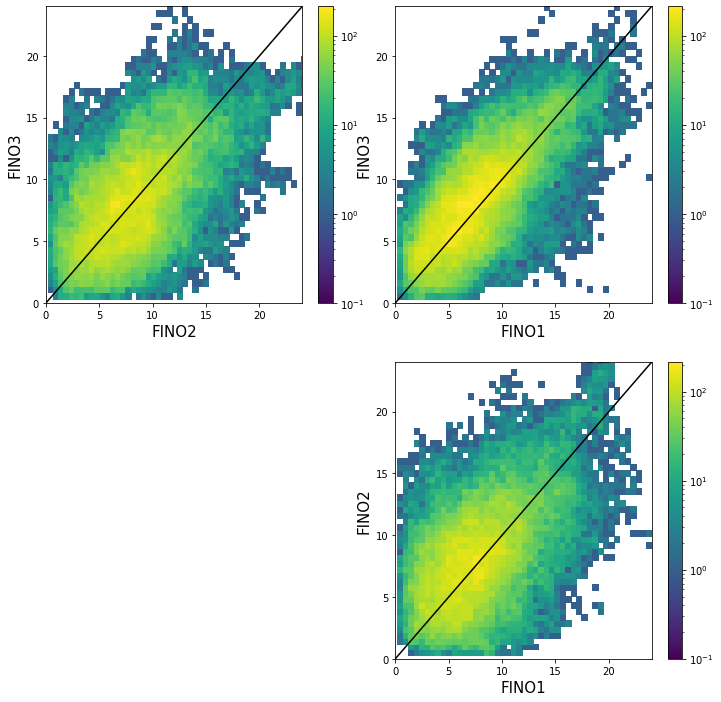

In [121]:
plt.figure(figsize=(12,12))
fig1 = plt.subplot2grid((2,4),(0,0),colspan=2)
plt.pcolormesh(f23_x, f23_y, f2_f3.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.plot([0,25],[0,25],c='k')
plt.colorbar()
plt.ylabel('FINO3',size=15)
plt.xlabel('FINO2',size=15)


fig2 = plt.subplot2grid((2,4),(0,2),colspan=2,sharey=fig1,sharex=fig1)
plt.pcolormesh(f13_x, f13_y, f1_f3.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.plot([0,25],[0,25],c='k')
plt.colorbar()
plt.ylabel('FINO3',size=15)
plt.xlabel('FINO1',size=15)

fig3 = plt.subplot2grid((2,4),(1,2),colspan=2,sharey=fig1,sharex=fig1)
plt.pcolormesh(f12_x, f12_y, f1_f2.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.colorbar()
plt.plot([0,25],[0,25],c='k')
plt.ylabel('FINO2',size=15)
plt.xlabel('FINO1',size=15)
plt.ylim(0,24)
plt.xlim(0,24)

plt.show()

# Test combine tower worked:

restart: FINO_2010051212
starting FN1.d03
restart: FINO_2010051412
starting FN1.d03


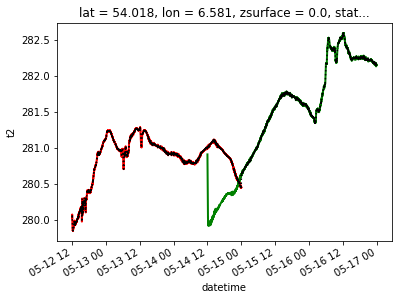

In [10]:
fn1_0 = Tower('{}{}/{}/FN1.d03'.format(wrf_dir,cases[0],restarts[0])).to_xarray(start_time=wrf_start[0],
                                                                                time_step=3.0,
                                                                                structure='unordered',
                                                                                heights=np.asarray([30.]),
                                                                                height_var='ph')

fn1_1 = Tower('{}{}/{}/FN1.d03'.format(wrf_dir,cases[0],restarts[1])).to_xarray(start_time=wrf_start[1],
                                                                                time_step=3.0,
                                                                                structure='unordered',
                                                                                heights=np.asarray([30.]),
                                                                                height_var='ph')

fn1_f = tsout_seriesReader('{}{}/'.format(wrf_dir,cases[0]),restarts[:2],wrf_start[:2],'d03',structure='unordered',
                           time_step=3.0,select_tower=['FN1'],
                           heights=np.asarray([30.]),height_var='ph')

fn1_0.t2.plot(c='r',lw=2.0)
fn1_1.t2.plot(c='g',lw=2.0)
fn1_f.t2.plot(c='k',ls=':')
